[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Segment Images with Segment Anything 2 (SAM2)

---

[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/facebookresearch/segment-anything-2)

Segment Anything Model 2 (SAM 2) is a foundation model designed to address promptable visual segmentation in both images and videos. The model extends its functionality to video by treating images as single-frame videos. Its design, a simple transformer architecture with streaming memory, enables real-time video processing. A model-in-the-loop data engine, which enhances the model and data through user interaction, was built to collect the SA-V dataset, the largest video segmentation dataset to date. SAM 2, trained on this extensive dataset, delivers robust performance across diverse tasks and visual domains.

![segment anything model](https://media.roboflow.com/notebooks/examples/segment-anything-model-2-paper.jpg)

This notebook is an extension of the official [notebook](https://github.com/facebookresearch/segment-anything-2/blob/main/notebooks/image_predictor_example.ipynb) prepared by Meta AI.

## Complementary materials

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-segment-images-with-sam-2.ipynb)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/what-is-segment-anything-2)

We recommend that you follow along in this notebook while reading the blog post on Segment Anything Model 2 (SAM2).

[![SAM2 blogpost](https://media.roboflow.com/notebooks/examples/blog-what-is-sam-2.png)](https://blog.roboflow.com/what-is-segment-anything-2)

## Setup

In [ ]:
!pip install ultralytics

### Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!pip uninstall matplotlib

^C


In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import SAM

Model summary: 595 layers, 224,446,642 parameters, 224,446,642 gradients

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000030.tif: 1024x1024 1 0, 756.4ms
Speed: 69.3ms preprocess, 756.4ms inference, 23.2ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000030.tif: 1024x1024 1 0, 313.3ms
Speed: 8.3ms preprocess, 313.3ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)


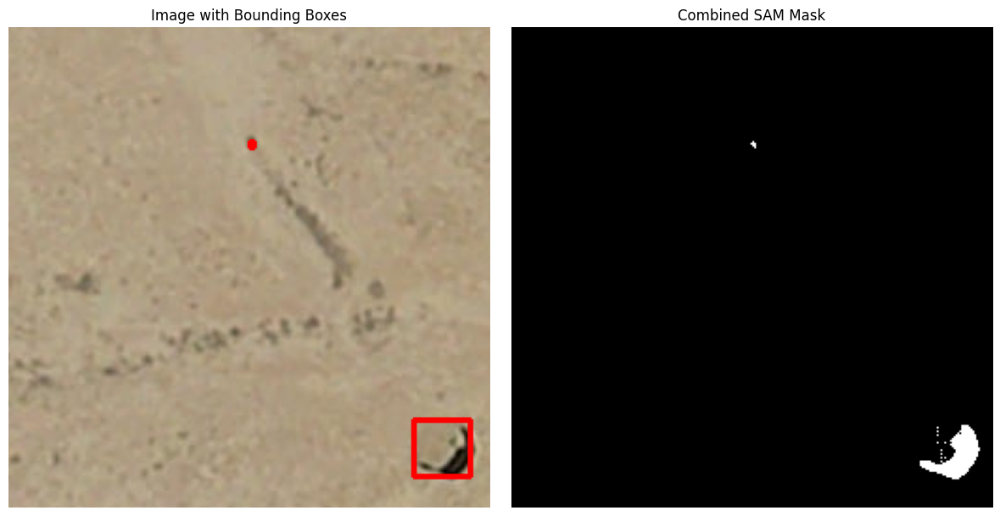

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import SAM

# --- Function to read bounding boxes from YOLO-style .txt file ---
def read_boxes_from_txt(file_path):
    boxes = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            x_min, y_min, x_max, y_max = map(float, parts[1:5])
            boxes.append([x_min, y_min, x_max, y_max])
    return boxes

# --- File paths ---
image_path = "D:/Osher/ISPRS_AUTOSINK1/figures/dataset_split/images/train_and_val/000000000030.tif"
bbox_file_path = "D:/Osher/ISPRS_AUTOSINK1/figures/dataset_split/labels/train_and_val/bbox/000000000030.txt"

# --- Load image ---
image = cv2.imread(image_path)
if image is None:
    raise FileNotFoundError(f"Image not found at: {image_path}")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# --- Load bounding boxes ---
bboxes = read_boxes_from_txt(bbox_file_path)
if not bboxes:
    raise ValueError(f"No bounding boxes found in: {bbox_file_path}")

# --- Load SAM model ---
model = SAM("sam2.1_l.pt")
model.info()

# --- Draw bounding boxes for visualization ---
image_with_boxes = image.copy()
for bbox in bboxes:
    x_min, y_min, x_max, y_max = map(int, bbox)
    cv2.rectangle(image_with_boxes, (x_min, y_min), (x_max, y_max), color=(255, 0, 0), thickness=2)

# --- Initialize empty mask ---
combined_mask = np.zeros(image.shape[:2], dtype=np.uint8)

# --- Run SAM on each box and combine masks ---
for bbox in bboxes:
    results = model(image_path, bboxes=[bbox])
    predicted_mask = results[0].masks.data.cpu().numpy()[0].astype(np.uint8)
    combined_mask = np.maximum(combined_mask, predicted_mask)

# --- Plot the results ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.imshow(image_with_boxes)
ax1.set_title("Image with Bounding Boxes")
ax1.axis('off')

ax2.imshow(combined_mask, cmap='gray')
ax2.set_title("Combined SAM Mask")
ax2.axis('off')

plt.tight_layout()
plt.show()


**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [11]:
import os
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from ultralytics import SAM
from scipy.ndimage import label
from skimage.measure import regionprops, find_contours
from scipy.spatial.distance import directed_hausdorff
import random

# === Parameters ===
N = 30
PP_THRESH = 0.5
HD_THRESH = 50
TITLE_FONTSIZE = 28
padding = 50  # For zoom region
TARGET_SIZE = (512, 512)  # Ensure all outputs are this size
  #000000000001 (9) 000000000002 (7) 000000000002 (8) 000000000008 (7) 000000000009 (10) 000000000012 (10) 000000000012 (8).tif 000000000015 (7).tif
# === Paths for multiple samples ===
samples = [
    {
        "image": "D:/Osher/ISPRS_AUTOSINK1/test_data/test_meged/images/000000000008 (3).tif",  #
        "bbox": "D:/Osher/ISPRS_AUTOSINK1/test_data/test_meged/300_images_final_pred_bbox/000000000008 (3).txt",
        "gt":   "D:/Osher/ISPRS_AUTOSINK1/test_data/test_meged/labels/000000000008 (3).tif"
    },
    {
        "image": "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/images/000000000065 (3).tif",  #
        "bbox": "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/output_of_final_model_second_pred_bbox/000000000065 (3).txt",
        "gt":   "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/labels/000000000065 (3).tif"
    },
    {
        "image": "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/images/000000000002 (3).tif",
        "bbox": "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/output_of_final_model_second_pred_bbox/000000000002 (3).txt",
        "gt":   "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/labels/000000000002 (3).tif"
    },
    {
        "image": "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/images/000000000038.tif",
        "bbox": "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/bboxCDs/000000000038.txt",
        "gt":   "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/labels/000000000038.tif"
    }
]

# === Load SAM model ===
model = SAM("sam2.1_l.pt")
model.info()

output_dir = "./outputs6"
os.makedirs(output_dir, exist_ok=True)

# === Set up full figure ===
fig, axs = plt.subplots(len(samples), 5, figsize=(23, 5 * len(samples)),
                        gridspec_kw={'wspace': 0.01, 'hspace': 0.05})

if len(samples) == 1:
    axs = [axs]

# === Helpers ===
def read_boxes(file_path):
    boxes = []
    with open(file_path) as f:
        for line in f:
            parts = line.strip().split()
            x1, y1, x2, y2 = map(float, parts[1:5])
            boxes.append([x1, y1, x2, y2])
    return boxes

def jitter_box(box, jitter=10, w=1024, h=1024):
    x1, y1, x2, y2 = box
    return [
        np.clip(x1 + np.random.randint(-jitter, jitter), 0, w),
        np.clip(y1 + np.random.randint(-jitter, jitter), 0, h),
        np.clip(x2 + np.random.randint(-jitter, jitter), 0, w),
        np.clip(y2 + np.random.randint(-jitter, jitter), 0, h)
    ]

def polsby_popper(region):
    if region.perimeter == 0:
        return 1.0
    return (4 * np.pi * region.area) / (region.perimeter ** 2)


# === Process each sample ===
for row_idx, sample in enumerate(samples):
    image_path = sample["image"]
    bbox_file = sample["bbox"]
    gt_path = sample["gt"]

    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    H, W = image.shape[:2]
    original_boxes = read_boxes(bbox_file)

    # === Monte Carlo Segmentation ===
    stacked_masks = []
    for _ in range(N):
        combined_mask = np.zeros((H, W), dtype=np.float32)
        for box in original_boxes:
            jittered = jitter_box(box, jitter=10, w=W, h=H)
            results = model(image_path, bboxes=[jittered])
            mask = results[0].masks.data.cpu().numpy()[0]
            combined_mask = np.maximum(combined_mask, mask)
        stacked_masks.append(combined_mask)

    gt_mask = cv2.imread(gt_path, cv2.IMREAD_UNCHANGED)
    if gt_mask.dtype == np.uint16:
        gt_mask = (gt_mask / gt_mask.max() * 255).astype(np.uint8)

    stacked = np.stack(stacked_masks)
    mean_mask = stacked.mean(axis=0)
    final_prediction = (mean_mask >= 0.3).astype(np.uint8)

    labeled_mask, _ = label(final_prediction)
    regions = regionprops(labeled_mask)
    filtered_mask = np.zeros_like(final_prediction)

    hulls = []
    pp_hd_labels = []
    for region in regions:
        if region.area < 50:
            continue
        pp = polsby_popper(region)
        keep = pp > PP_THRESH
        if keep:
            for y, x in region.coords:
                filtered_mask[y, x] = 1
    # === Random Sample Mask ===
    random_index = random.randint(0, len(stacked_masks) - 1)
    random_mask = stacked_masks[random_index]

    # === Zoom Region (square crop around bboxes) ===
    x1s, y1s, x2s, y2s = zip(*original_boxes)
    x1 = int(min(x1s))
    y1 = int(min(y1s))
    x2 = int(max(x2s))
    y2 = int(max(y2s))
    
    # Add some padding, but make sure it stays within image bounds
    pad = 20  # Smaller padding than before
    x1 = max(0, x1 - pad)
    y1 = max(0, y1 - pad)
    x2 = min(W, x2 + pad)
    y2 = min(H, y2 + pad)
    
    # Make the crop square by expanding the shorter side
    width = x2 - x1
    height = y2 - y1
    diff = abs(width - height)
    
    if width > height:
        y1 = max(0, y1 - diff // 2)
        y2 = min(H, y2 + (diff - diff // 2))
    else:
        x1 = max(0, x1 - diff // 2)
        x2 = min(W, x2 + (diff - diff // 2))
    
    # Final crop size
    crop_w, crop_h = x2 - x1, y2 - y1
    scale_x = TARGET_SIZE[0] / crop_w
    scale_y = TARGET_SIZE[1] / crop_h

    def crop_and_resize(img):
        cropped = img[y1:y2, x1:x2]
        interp = cv2.INTER_NEAREST if len(cropped.shape) == 2 else cv2.INTER_LINEAR
        return cv2.resize(cropped, TARGET_SIZE, interpolation=interp)

    gt_mask = cv2.imread(gt_path, cv2.IMREAD_UNCHANGED)
    if gt_mask.dtype == np.uint16:
        gt_mask = (gt_mask / gt_mask.max() * 255).astype(np.uint8)
    elif gt_mask.dtype == np.uint8:
        gt_mask = (gt_mask > 0).astype(np.uint8) * 255   
    
    # Apply cropping and resizing
    image = crop_and_resize(image)
    random_mask = crop_and_resize(random_mask)
    mean_mask = crop_and_resize(mean_mask)
    final_prediction = crop_and_resize(final_prediction)
    filtered_mask = crop_and_resize(filtered_mask)
    gt_mask = crop_and_resize(gt_mask)

    original_boxes = [[(x1_ - x1) * scale_x, (y1_ - y1) * scale_y,
                       (x2_ - x1) * scale_x, (y2_ - y1) * scale_y]
                      for x1_, y1_, x2_, y2_ in original_boxes]

    # === Updated Plotting Section ===
    titles = ["Image with BBoxes", "SAM Pred.", "Mean Mask", "Filtered Prediction", "GT"]
    images = [image, random_mask, mean_mask, filtered_mask, gt_mask]
    cmaps = [None, 'gray', 'magma', 'gray', 'gray']
    
    for col_idx, (title, img, cmap) in enumerate(zip(titles, images, cmaps)):
        ax = axs[row_idx][col_idx] if len(samples) > 1 else axs[col_idx]
        ax.imshow(img, cmap=cmap, vmin=0, vmax=1 if col_idx == 1 else None)
        if row_idx == 0:
            ax.set_title(title, fontsize=TITLE_FONTSIZE)
        ax.axis('off')
    
        if col_idx == 0:
            for box in original_boxes:
                x1_, y1_, x2_, y2_ = box
                ax.plot([x1_, x2_, x2_, x1_, x1_], [y1_, y1_, y2_, y2_, y1_], color='red', linewidth=2)


# === Save ===
plt.subplots_adjust(left=0.01, right=0.99, top=0.96, bottom=0.05, wspace=0.01, hspace=0.01)
output_pdf = os.path.join(output_dir, "cwbj.pdf")
plt.savefig(output_pdf, format="pdf", dpi=150, bbox_inches='tight', transparent=False)
plt.close()


Model summary: 595 layers, 224,446,642 parameters, 224,446,642 gradients

image 1/1 D:\Osher\ISPRS_AUTOSINK1\test_data\test_meged\images\000000000008 (3).tif: 1024x1024 1 0, 287.2ms
Speed: 8.8ms preprocess, 287.2ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\test_data\test_meged\images\000000000008 (3).tif: 1024x1024 1 0, 284.8ms
Speed: 9.0ms preprocess, 284.8ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\test_data\test_meged\images\000000000008 (3).tif: 1024x1024 1 0, 285.1ms
Speed: 8.8ms preprocess, 285.1ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\test_data\test_meged\images\000000000008 (3).tif: 1024x1024 1 0, 285.1ms
Speed: 8.9ms preprocess, 285.1ms inference, 0.9ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\test_data\test_meged\images\000000000008 (3).tif: 1024x

🔍 Processing 000000000000.tif...

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000000.tif: 1024x1024 1 0, 298.7ms
Speed: 11.4ms preprocess, 298.7ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000000.tif: 1024x1024 1 0, 282.2ms
Speed: 8.5ms preprocess, 282.2ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000000.tif: 1024x1024 1 0, 285.6ms
Speed: 9.6ms preprocess, 285.6ms inference, 1.2ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000000.tif: 1024x1024 1 0, 284.2ms
Speed: 8.7ms preprocess, 284.2ms inference, 1.2ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\0000000

C:\Users\osherr\.conda\envs\sam2ft_env\lib\site-packages\rasterio\__init__.py:378: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = writer(


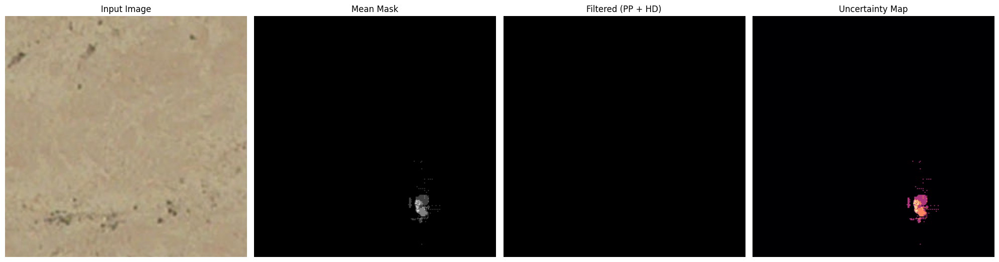

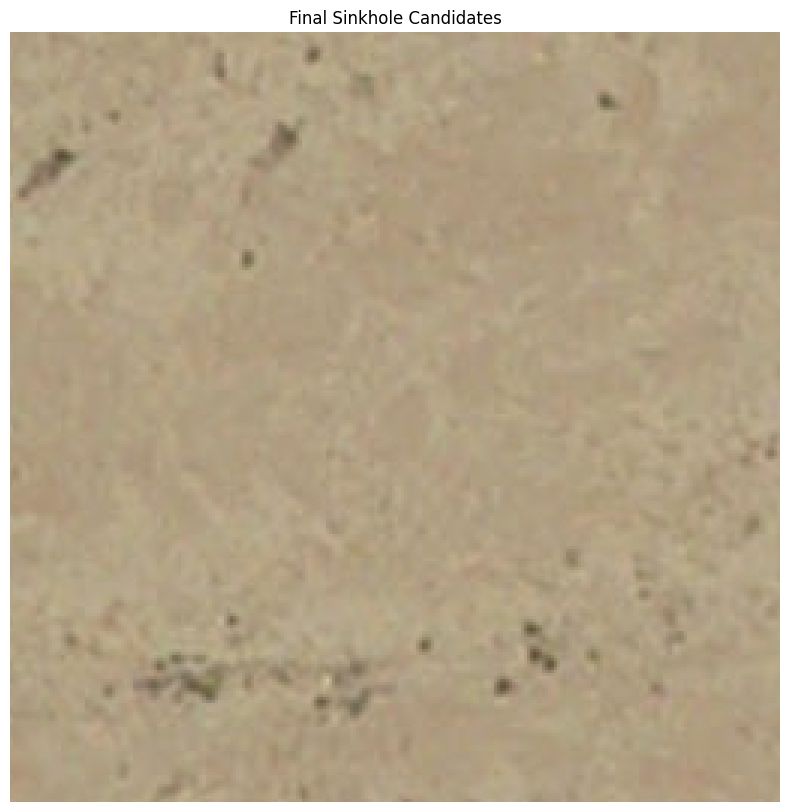

🔍 Processing 000000000001.tif...

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000001.tif: 1024x1024 1 0, 285.2ms
Speed: 9.0ms preprocess, 285.2ms inference, 1.2ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000001.tif: 1024x1024 1 0, 288.2ms
Speed: 8.5ms preprocess, 288.2ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000001.tif: 1024x1024 1 0, 284.3ms
Speed: 7.9ms preprocess, 284.3ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\000000000001.tif: 1024x1024 1 0, 286.1ms
Speed: 9.0ms preprocess, 286.1ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 D:\Osher\ISPRS_AUTOSINK1\figures\dataset_split\images\train_and_val\00000000

KeyboardInterrupt: 

In [8]:
import os  ##SinkSAM
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from ultralytics import SAM
from scipy.ndimage import label
from skimage.measure import regionprops, find_contours
from scipy.spatial.distance import directed_hausdorff
import rasterio

# Polsby–Popper score
def polsby_popper(region):
    if region.perimeter == 0:
        return 1.0
    return (4 * np.pi * region.area) / (region.perimeter ** 2)

# Hausdorff distance between region and its convex hull
def hausdorff_distance(mask, region):
    temp_mask = np.zeros_like(mask)
    coords = region.coords
    for y, x in coords:
        temp_mask[y, x] = 1

    contours = find_contours(temp_mask, 0.5)
    if not contours:
        return 0.0

    contour = max(contours, key=len)
    if contour.shape[0] < 3:
        return 0.0
    hull = cv2.convexHull(contour.astype(np.float32))

    h1 = directed_hausdorff(contour, hull[:, 0, :])[0]
    h2 = directed_hausdorff(hull[:, 0, :], contour)[0]
    return max(h1, h2)

# Read bounding boxes
def read_boxes(file_path):
    boxes = []
    with open(file_path) as f:
        for line in f:
            parts = line.strip().split()
            x1, y1, x2, y2 = map(float, parts[1:5])
            boxes.append([x1, y1, x2, y2])
    return boxes

# Jitter bounding box
def jitter_box(box, jitter=10, w=1024, h=1024):
    x1, y1, x2, y2 = box
    return [
        np.clip(x1 + np.random.randint(-jitter, jitter), 0, w),
        np.clip(y1 + np.random.randint(-jitter, jitter), 0, h),
        np.clip(x2 + np.random.randint(-jitter, jitter), 0, w),
        np.clip(y2 + np.random.randint(-jitter, jitter), 0, h)]

# Main image processing function
def process_image(image_path, bbox_path, model, N=10, threshold=0.5, pp_thresh=0, hd_thresh=150):  #maybe 0.3 for pp
    image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    H, W = image.shape[:2]
    boxes = read_boxes(bbox_path)
    stacked_masks = []

    for _ in range(N):
        combined_mask = np.zeros((H, W), dtype=np.float32)
        for box in boxes:
            jittered = jitter_box(box, jitter=10, w=W, h=H)
            results = model(image_path, bboxes=[jittered])
            mask = results[0].masks.data.cpu().numpy()[0]
            combined_mask = np.maximum(combined_mask, mask)
        stacked_masks.append(combined_mask)

    stacked = np.stack(stacked_masks)
    mean_mask = stacked.mean(axis=0)
    uncertainty_map = -mean_mask * np.log(mean_mask + 1e-8) - (1 - mean_mask) * np.log(1 - mean_mask + 1e-8)
    final_prediction = (mean_mask >= threshold).astype(np.uint8)

    labeled_mask, _ = label(final_prediction)
    regions = regionprops(labeled_mask)
    filtered_mask = np.zeros_like(final_prediction)

    print(f"🔎 Found {len(regions)} regions in {os.path.basename(image_path)}")

    for i, region in enumerate(regions):
        if region.area < 50:
            continue
        pp = polsby_popper(region)
        hd = hausdorff_distance(final_prediction, region)

        print(f"  Region {i+1}:")
        print(f"    ➤ Area = {region.area}")
        print(f"    ➤ Polsby–Popper = {pp:.3f}")
        print(f"    ➤ Hausdorff Dist = {hd:.3f}")

        if pp > pp_thresh and hd < hd_thresh:
            for y, x in region.coords:
                filtered_mask[y, x] = 1
            print("    ✅ Kept")
        else:
            print("    ❌ Removed")

    return image, mean_mask, filtered_mask, uncertainty_map

def run_on_folder(image_folder, bbox_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)
    model = SAM("sam2.1_l.pt")

    for filename in os.listdir(image_folder):
        if not filename.lower().endswith(('.tif', '.tiff')):
            continue

        image_path = os.path.join(image_folder, filename)
        bbox_path = os.path.join(bbox_folder, filename.replace('.tif', '.txt').replace('.tiff', '.txt'))

        if not os.path.exists(bbox_path):
            print(f"❌ Skipping {filename}: No bbox file")
            continue

        # Check if the bbox file is empty
        if os.path.getsize(bbox_path) == 0:
            print(f"⚠️ Empty bbox for {filename}, saving zero mask.")
            with rasterio.open(image_path) as src:
                height, width = src.height, src.width
            out_path = os.path.join(output_folder, filename)
            with rasterio.open(out_path, 'w', driver='GTiff', height=height, width=width,
                               count=1, dtype='uint8') as dst:
                dst.write(np.zeros((height, width), dtype='uint8'), 1)
            continue

        print(f"🔍 Processing {filename}...")
        image, mean_mask, filtered_mask, uncertainty_map = process_image(image_path, bbox_path, model)

        out_path = os.path.join(output_folder, filename)
        with rasterio.open(out_path, 'w', driver='GTiff', height=filtered_mask.shape[0],
                           width=filtered_mask.shape[1], count=1, dtype='uint8') as dst:
            dst.write(filtered_mask.astype('uint8'), 1)

        # Visualization
        fig, axs = plt.subplots(1, 4, figsize=(20, 6))
        axs[0].imshow(image)
        axs[0].set_title("Input Image")
        axs[0].axis('off')

        axs[1].imshow(mean_mask, cmap='gray')
        axs[1].set_title("Mean Mask")
        axs[1].axis('off')

        axs[2].imshow(filtered_mask, cmap='gray')
        axs[2].set_title("Filtered (PP + HD)")
        axs[2].axis('off')

        axs[3].imshow(uncertainty_map, cmap='magma')
        axs[3].set_title("Uncertainty Map")
        axs[3].axis('off')

        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.title("Final Sinkhole Candidates")
        labeled_final, _ = label(filtered_mask)
        for region in regionprops(labeled_final):
            minr, minc, maxr, maxc = region.bbox
            plt.plot([minc, maxc, maxc, minc, minc],
                     [minr, minr, maxr, maxr, minr], color='red', linewidth=2)
        plt.axis('off')
        plt.show()

# Set paths
image_folder ="D:/Osher/ISPRS_AUTOSINK1/figures/dataset_split/images/train_and_val/"
bbox_folder = "D:/Osher/ISPRS_AUTOSINK1/figures/dataset_split/labels/train_and_val/bbox"
output_folder = "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/for_figures"


# Run
run_on_folder(image_folder, bbox_folder, output_folder)

In [ ]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import rasterio
from skimage.transform import resize
from ultralytics import SAM
import matplotlib.patches as patches  # Make sure this is imported
# Define the device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def read_boxes_from_txt(file_path, confidence_threshold=0.2, min_box_size=0):
    """
    Read bounding boxes from a text file in the format: class_id x_min y_min x_max y_max confidence
    Only keep boxes with confidence above threshold and both width & height >= min_box_size.
    """
    boxes = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            x_min, y_min, x_max, y_max, confidence = map(float, parts[1:6])
            w = x_max - x_min
            h = y_max - y_min
            if confidence >= confidence_threshold and w >= min_box_size and h >= min_box_size:
                boxes.append([x_min, y_min, x_max, y_max])
    return torch.tensor(boxes, device=device)

def process_bboxes_and_generate_mask(image_path, bboxes_tensor, model):
    """
    Process bounding boxes and generate combined mask.
    """
    image = Image.open(image_path)
    img_w, img_h = image.size

    if image.mode == 'RGBA' or image.mode == 'LA' or (image.mode == 'P' and 'transparency' in image.info):
        print(f"Skipping {image_path} as it has an alpha channel")
        return None, None

    if image.mode != 'RGB':
        image = image.convert('RGB')

    bboxes_pixel = bboxes_tensor.cpu().numpy()
    combined_prob_map = np.zeros((img_h, img_w), dtype=np.float32)

    for i, bbox in enumerate(bboxes_pixel):
        x_min, y_min, x_max, y_max = bbox
        prompt = [x_min, y_min, x_max, y_max]
        results = model(image_path, bboxes=[prompt])

        if results[0].masks is None:
            print(f"⚠️ No mask returned for bbox {prompt}")
            continue

        medsam_seg_prob = results[0].masks.data.cpu().numpy().squeeze()
        medsam_seg_prob_resized = resize(medsam_seg_prob, (img_h, img_w), anti_aliasing=False)
        combined_prob_map = np.maximum(combined_prob_map, medsam_seg_prob_resized)

    if np.max(combined_prob_map) == 0:
        return None, None

    combined_mask = (combined_prob_map > 0.5).astype(np.uint8)
    return combined_prob_map, combined_mask

def process_folder(image_folder, bbox_folder, output_folder, model, confidence_threshold=0.2):
    """
    Process a folder of images and corresponding bounding boxes, generate combined masks, save the results, and display them.
    """
    os.makedirs(output_folder, exist_ok=True)

    for filename in os.listdir(image_folder):
        if filename.endswith(".tif") or filename.endswith(".tiff"):
            image_path = os.path.join(image_folder, filename)
            base_name = os.path.splitext(filename)[0]
            bbox_file_path = os.path.join(bbox_folder, f"{base_name}.txt")

            if not os.path.exists(bbox_file_path):
                print(f"❌ Skipping {filename}: No matching bbox file")
                continue

            bboxes_tensor = read_boxes_from_txt(bbox_file_path, confidence_threshold)

            with Image.open(image_path) as img:
                img_w, img_h = img.size
                image_rgb = img.convert('RGB')
                image_np = np.array(image_rgb)

            if len(bboxes_tensor) == 0:
                print(f"⚠️ No valid bboxes in {filename}, saving zero mask.")
                combined_mask = np.zeros((img_h, img_w), dtype=np.uint8)
            else:
                combined_prob_map, combined_mask = process_bboxes_and_generate_mask(image_path, bboxes_tensor, model)
                if combined_mask is None:
                    print(f"⚠️ SAM failed or no mask for {filename}, saving zero mask.")
                    combined_mask = np.zeros((img_h, img_w), dtype=np.uint8)

            # === Save the mask ===
            output_tiff_path = os.path.join(output_folder, filename)
            with rasterio.open(
                output_tiff_path,
                'w',
                driver='GTiff',
                height=combined_mask.shape[0],
                width=combined_mask.shape[1],
                count=1,
                dtype='uint8'
            ) as dst:
                dst.write(combined_mask, 1)

            print(f"✅ Processed {filename} and saved combined mask to {output_tiff_path}")

            # === Visualization ===
            fig, ax = plt.subplots(figsize=(10, 10))
            ax.imshow(image_np)
            ax.imshow(combined_mask, cmap='Reds', alpha=0.4)
            ax.set_title(f"{filename} — BBoxes + Mask")
            ax.axis('off')

            for box in bboxes_tensor.cpu().numpy():
                x_min, y_min, x_max, y_max = box
                rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                         linewidth=2, edgecolor='cyan', facecolor='none', linestyle='--')
                ax.add_patch(rect)

            plt.tight_layout()
            plt.show()
# === Define the folder paths ===
image_folder = "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/images/"
bbox_folder = "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/bbox/"
output_folder = "D:/Osher/ISPRS_AUTOSINK1/train_data/train_merged/SAM_zero_shot/"

# === Load the SAM model ===
model = SAM("sam2.1_l.pt")

# === Process the folder ===
process_folder(image_folder, bbox_folder, output_folder, model, confidence_threshold=0.5)


In [ ]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import rasterio
from skimage.transform import resize
from ultralytics import SAM

# Define the device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def read_boxes_from_txt(file_path, confidence_threshold=0.2):
    boxes = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            x_min, y_min, x_max, y_max, confidence = map(float, parts[1:6])
            if confidence >= confidence_threshold:
                boxes.append([x_min, y_min, x_max, y_max])
    return torch.tensor(boxes, device=device)

def process_bboxes_and_generate_mask(image_path, bboxes_tensor, model):
    image = Image.open(image_path)
    img_w, img_h = image.size

    if image.mode == 'RGBA' or image.mode == 'LA' or (image.mode == 'P' and 'transparency' in image.info):
        print(f"⚠️ Skipping {image_path} as it has an alpha channel")
        return None, None

    if image.mode != 'RGB':
        image = image.convert('RGB')

    bboxes_pixel = bboxes_tensor.cpu().numpy()
    combined_prob_map = np.zeros((img_h, img_w), dtype=np.float32)

    valid_mask_found = False

    for i, bbox in enumerate(bboxes_pixel):
        x_min, y_min, x_max, y_max = bbox
        prompt = [x_min, y_min, x_max, y_max]

        results = model(image_path, bboxes=[prompt])

        if not results or results[0].masks is None:
            print(f"⚠️ No mask returned for bbox {prompt} in {image_path}")
            continue

        medsam_seg_prob = results[0].masks.data.cpu().numpy().squeeze()
        medsam_seg_prob_resized = resize(medsam_seg_prob, (img_h, img_w), anti_aliasing=False)
        combined_prob_map = np.maximum(combined_prob_map, medsam_seg_prob_resized)
        valid_mask_found = True

    if not valid_mask_found:
        return None, None

    combined_mask = (combined_prob_map > 0.5).astype(np.uint8)
    return combined_prob_map, combined_mask

def process_folder(image_folder, bbox_folder, output_folder, model, confidence_threshold=0.2):
    os.makedirs(output_folder, exist_ok=True)

    for filename in os.listdir(image_folder):
        if not (filename.endswith(".tif") or filename.endswith(".tiff")):
            continue

        image_path = os.path.join(image_folder, filename)
        base_name = os.path.splitext(filename)[0]
        bbox_file_path = os.path.join(bbox_folder, f"{base_name}.txt")

        if not os.path.exists(bbox_file_path):
            print(f"❌ Skipping {filename}: No matching bbox file")
            continue

        bboxes_tensor = read_boxes_from_txt(bbox_file_path, confidence_threshold)

        # Read image to get dimensions (for zero mask fallback)
        with Image.open(image_path) as img:
            img_w, img_h = img.size

        if len(bboxes_tensor) == 0:
            print(f"⚠️ No bboxes above threshold for {filename}, creating empty mask.")
            combined_mask = np.zeros((img_h, img_w), dtype=np.uint8)
        else:
            combined_prob_map, combined_mask = process_bboxes_and_generate_mask(image_path, bboxes_tensor, model)
            if combined_mask is None:
                print(f"⚠️ No valid masks for {filename}, creating empty mask.")
                combined_mask = np.zeros((img_h, img_w), dtype=np.uint8)

        output_tiff_path = os.path.join(output_folder, filename)
        with rasterio.open(
            output_tiff_path,
            'w',
            driver='GTiff',
            height=combined_mask.shape[0],
            width=combined_mask.shape[1],
            count=1,
            dtype='uint8'
        ) as dst:
            dst.write(combined_mask, 1)

        print(f"✅ Processed {filename} and saved mask to {output_tiff_path}")

# === Define the folder paths
image_folder = "D:/Osher/ISPRS_AUTOSINK1/2023_train_stride/images/"
bbox_folder = "D:/Osher/ISPRS_AUTOSINK1/2023_train_stride/images/bbox_sub_filled_raw_depth_fixed/"
output_folder = "D:/Osher/ISPRS_AUTOSINK1/2023_train_stride/images/SAM2.1_zero_shot"

# === Load the SAM model
model = SAM("sam2.1_l.pt")

# === Process the folder with a confidence threshold
process_folder(image_folder, bbox_folder, output_folder, model, confidence_threshold=0.5)


In [ ]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
import rasterio
from skimage.transform import resize
from ultralytics import SAM

# Define the device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def read_points_from_txt(file_path):
    """
    Read points from a text file in the format: x,y
    
    :param file_path: Path to the text file
    :return: List of points in the format [[x, y], ...]
    """
    points = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split(',')
            x, y = map(float, parts)
            points.append([x, y])
    return points

def process_points_and_generate_mask(image_path, points, model):
    """
    Process points and generate combined mask.
    
    :param image_path: Path to the image
    :param points: List of points in the format [[x, y], ...]
    :param model: SAM model
    :return: Combined probability map and combined mask
    """
    # Read the image to get dimensions
    image = Image.open(image_path)
    img_w, img_h = image.size

    # Check if the image has an alpha channel (4 bands) and skip if it does
    if image.mode == 'RGBA' or image.mode == 'LA' or (image.mode == 'P' and 'transparency' in image.info):
        print(f"Skipping {image_path} as it has an alpha channel")
        return None, None

    # Convert image to RGB if it's not already in RGB
    if image.mode != 'RGB':
        image = image.convert('RGB')

    # Initialize an array to store the combined probability map
    combined_prob_map = np.zeros((img_h, img_w), dtype=np.float32)

    # Process each point
    for point in points:
        x, y = point
        
        # Prepare image + point prompt for the model
        results = model(image_path, points=[point], labels=[1])

        # Extract the predicted mask
        medsam_seg_prob = results[0].masks.data.cpu().numpy().squeeze()

        # Resize the probability map to match the original image size
        medsam_seg_prob_resized = resize(medsam_seg_prob, (img_h, img_w), anti_aliasing=False)

        # Combine it with the existing probability map
        combined_prob_map = np.maximum(combined_prob_map, medsam_seg_prob_resized)

    # Convert the combined probability map to a hard mask
    combined_mask = (combined_prob_map > 0.5).astype(np.uint8)
    
    return combined_prob_map, combined_mask

def process_folder(image_folder, points_folder, output_folder, model):
    """
    Process a folder of images and corresponding points, generate combined masks, and save the results.
    
    :param image_folder: Path to the folder containing images
    :param points_folder: Path to the folder containing points
    :param output_folder: Path to the folder to save the combined masks
    :param model: SAM model
    """
    os.makedirs(output_folder, exist_ok=True)

    for filename in os.listdir(image_folder):
        if filename.endswith(".tif") or filename.endswith(".tiff"):
            image_path = os.path.join(image_folder, filename)
            points_file_path = os.path.join(points_folder, filename.replace(".tif", ".txt").replace(".tiff", ".txt"))

            # Read points from the text file
            points = read_points_from_txt(points_file_path)

            # Process points and generate the combined mask
            combined_prob_map, combined_mask = process_points_and_generate_mask(image_path, points, model)

            if combined_mask is None:
                continue

            # Save the combined mask as a TIFF file
            output_tiff_path = os.path.join(output_folder, filename)
            with rasterio.open(
                output_tiff_path,
                'w',
                driver='GTiff',
                height=combined_mask.shape[0],
                width=combined_mask.shape[1],
                count=1,
                dtype='uint8'
            ) as dst:
                dst.write(combined_mask, 1)
            print(f"Processed {filename} and saved combined mask to {output_tiff_path}")

# Define the folder paths
image_folder = "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/"
points_folder = "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/points_from_masks/"
output_folder = "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/sam2.1_results_from_points/"

# Load the SAM model7
model = SAM("sam2.1_l.pt")

# Process the folder with points as input
process_folder(image_folder, points_folder, output_folder, model)


C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 1 - 000000000000.tif:
IoU: 0.8143
F1: 0.8977
Accuracy: 0.9962
Precision: 0.8174
Recall: 0.9955
IoU_Sinkholes: 0.8143
IoU_Background: 0.9961
Dice: 0.8977
TPR: 0.9955
FPR: 0.0038


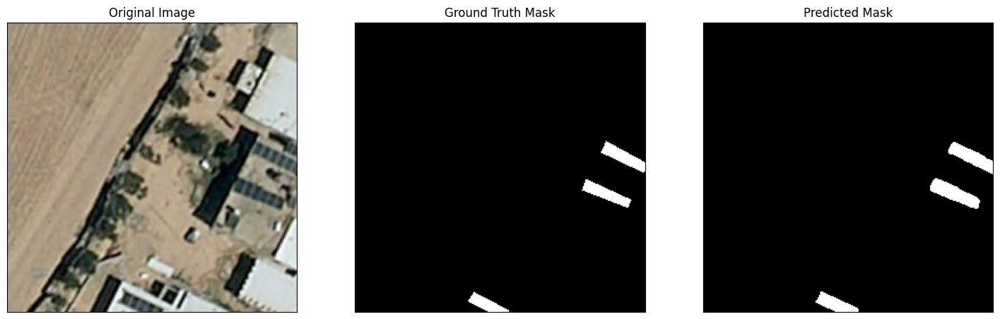

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 2 - 000000000002.tif:
IoU: 0.8000
F1: 0.8889
Accuracy: 0.9988
Precision: 0.8184
Recall: 0.9726
IoU_Sinkholes: 0.8000
IoU_Background: 0.9988
Dice: 0.8889
TPR: 0.9726
FPR: 0.0011


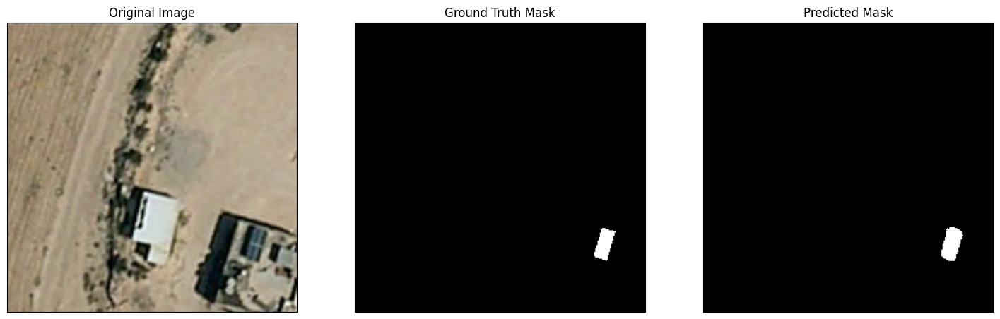

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 3 - 000000000003.tif:
IoU: 0.4540
F1: 0.6245
Accuracy: 0.9957
Precision: 0.4549
Recall: 0.9958
IoU_Sinkholes: 0.4540
IoU_Background: 0.9956
Dice: 0.6245
TPR: 0.9958
FPR: 0.0043


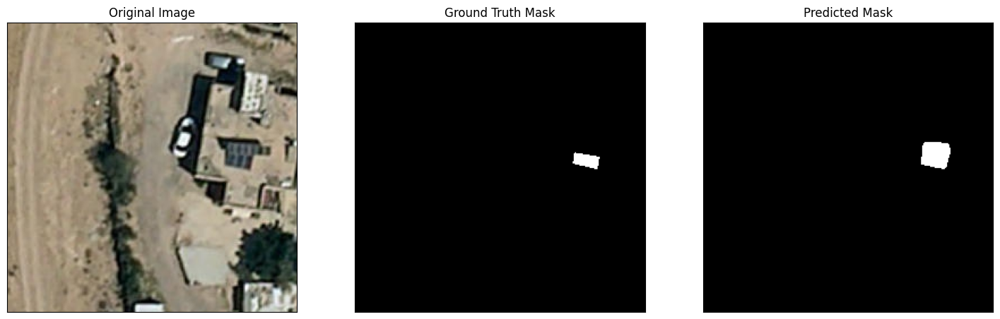

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 4 - 000000002502.tif:
IoU: 0.7602
F1: 0.8638
Accuracy: 0.9978
Precision: 0.7602
Recall: 1.0000
IoU_Sinkholes: 0.7602
IoU_Background: 0.9978
Dice: 0.8638
TPR: 1.0000
FPR: 0.0022


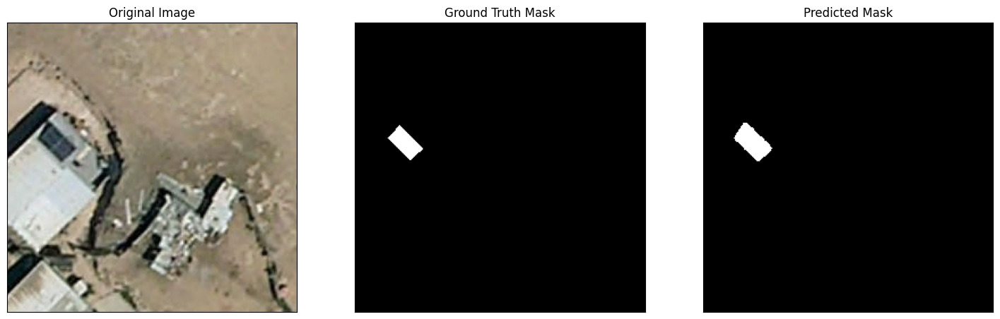

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 5 - 000000002507.tif:
IoU: 0.7043
F1: 0.8265
Accuracy: 0.9992
Precision: 0.7081
Recall: 0.9924
IoU_Sinkholes: 0.7043
IoU_Background: 0.9992
Dice: 0.8265
TPR: 0.9924
FPR: 0.0008


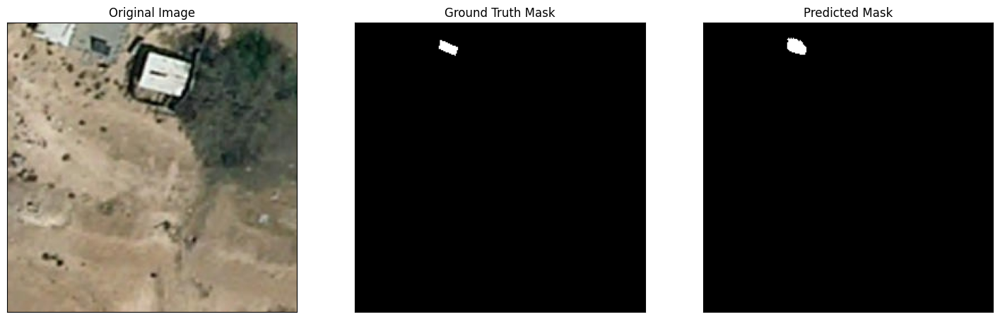

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 6 - 000000002508.tif:
IoU: 0.9069
F1: 0.9512
Accuracy: 0.9990
Precision: 0.9095
Recall: 0.9969
IoU_Sinkholes: 0.9069
IoU_Background: 0.9990
Dice: 0.9512
TPR: 0.9969
FPR: 0.0010


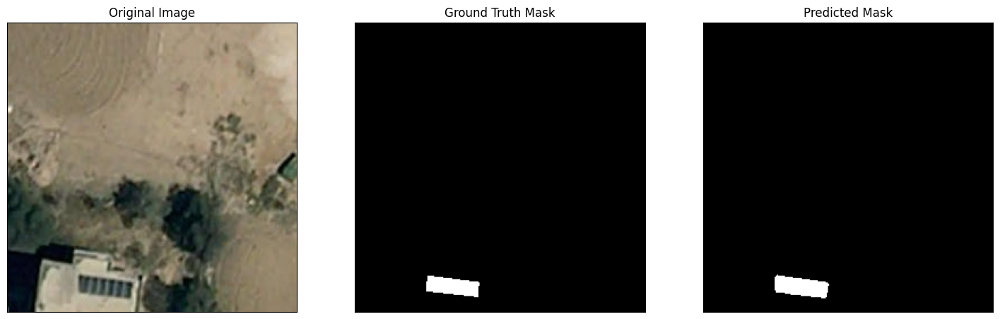

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 7 - 000000002520.tif:
IoU: 0.0727
F1: 0.1356
Accuracy: 0.9992
Precision: 0.0741
Recall: 0.8000
IoU_Sinkholes: 0.0727
IoU_Background: 0.9992
Dice: 0.1356
TPR: 0.8000
FPR: 0.0008


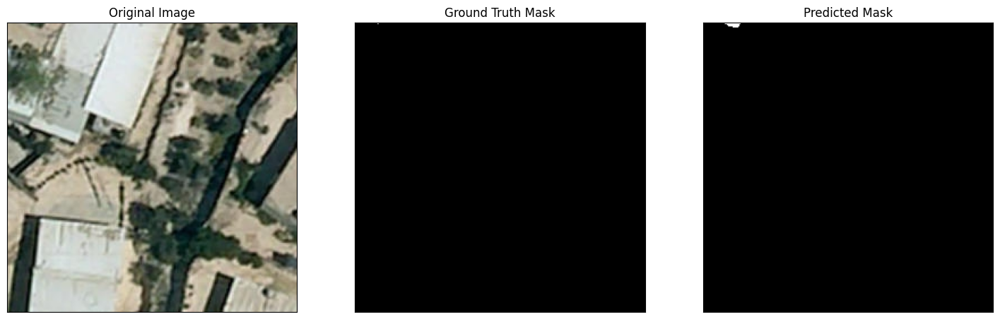

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 8 - 000000002523.tif:
IoU: 0.5778
F1: 0.7324
Accuracy: 0.9954
Precision: 0.5778
Recall: 1.0000
IoU_Sinkholes: 0.5778
IoU_Background: 0.9953
Dice: 0.7324
TPR: 1.0000
FPR: 0.0047


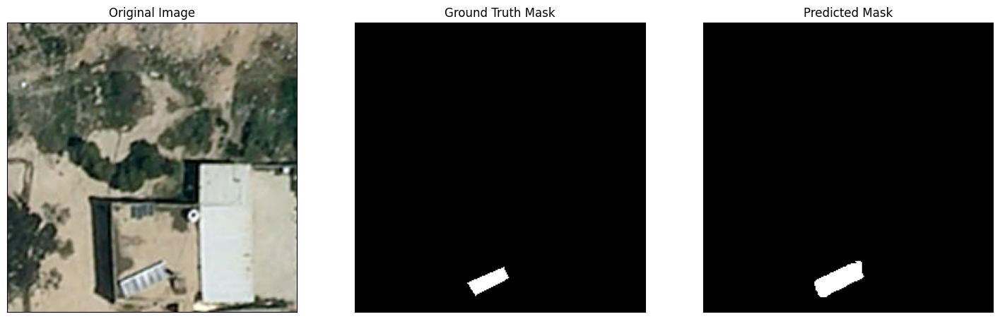

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 9 - 000000002526.tif:
IoU: 0.7936
F1: 0.8849
Accuracy: 0.9993
Precision: 0.8047
Recall: 0.9830
IoU_Sinkholes: 0.7936
IoU_Background: 0.9993
Dice: 0.8849
TPR: 0.9830
FPR: 0.0006


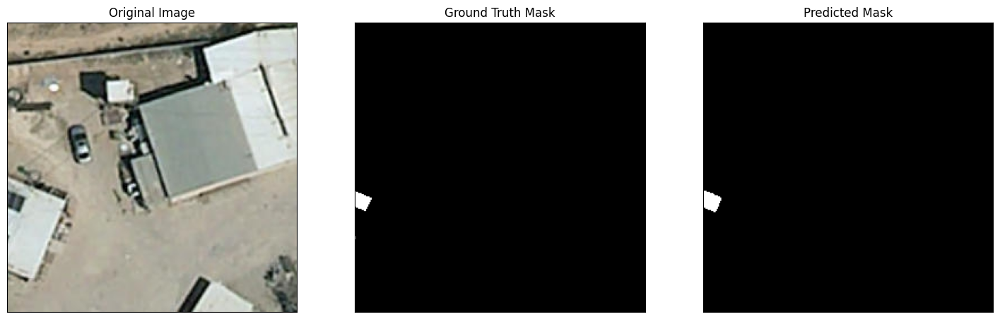

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 10 - 000000002532.tif:
IoU: 0.4971
F1: 0.6641
Accuracy: 0.9933
Precision: 0.4971
Recall: 1.0000
IoU_Sinkholes: 0.4971
IoU_Background: 0.9933
Dice: 0.6641
TPR: 1.0000
FPR: 0.0067


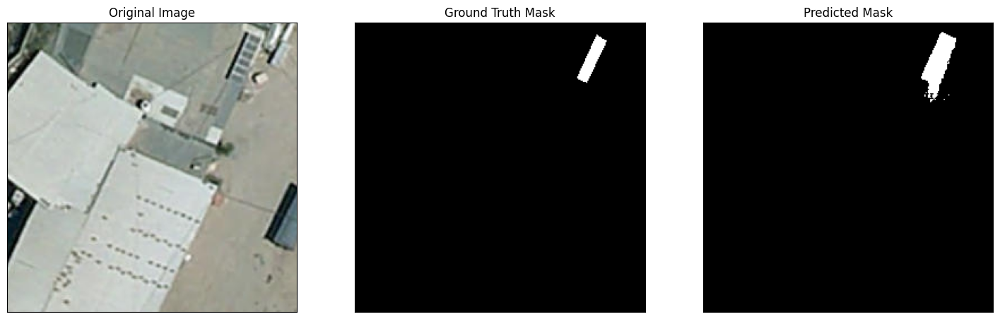

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 11 - 000000002533.tif:
IoU: 0.7887
F1: 0.8819
Accuracy: 0.9983
Precision: 0.8054
Recall: 0.9744
IoU_Sinkholes: 0.7887
IoU_Background: 0.9983
Dice: 0.8819
TPR: 0.9744
FPR: 0.0016


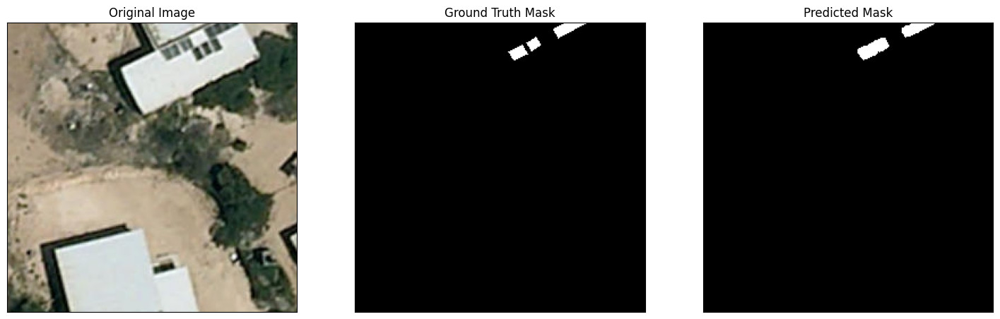

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 12 - 000000002541.tif:
IoU: 0.7549
F1: 0.8603
Accuracy: 0.9981
Precision: 0.7549
Recall: 1.0000
IoU_Sinkholes: 0.7549
IoU_Background: 0.9981
Dice: 0.8603
TPR: 1.0000
FPR: 0.0019


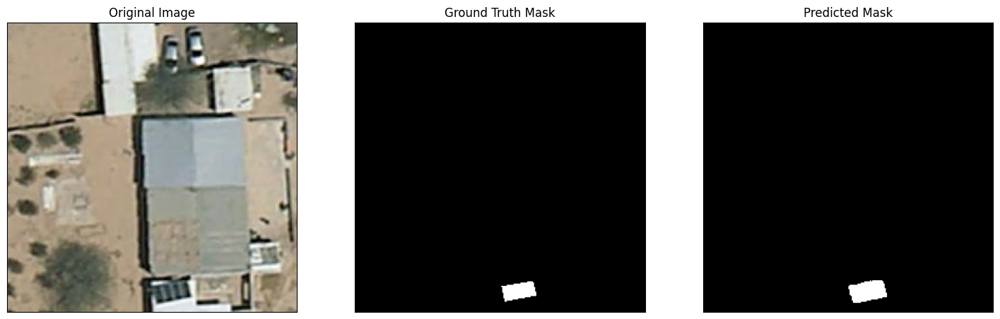

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 13 - 000000002554.tif:
IoU: 0.5840
F1: 0.7374
Accuracy: 0.9898
Precision: 0.8722
Recall: 0.6386
IoU_Sinkholes: 0.5840
IoU_Background: 0.9896
Dice: 0.7374
TPR: 0.6386
FPR: 0.0022


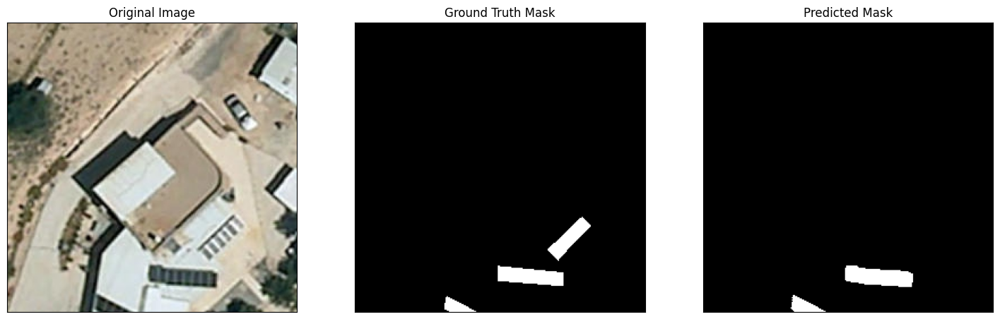

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 14 - 000000002573.tif:
IoU: 0.5125
F1: 0.6777
Accuracy: 0.9979
Precision: 0.5125
Recall: 1.0000
IoU_Sinkholes: 0.5125
IoU_Background: 0.9979
Dice: 0.6777
TPR: 1.0000
FPR: 0.0021


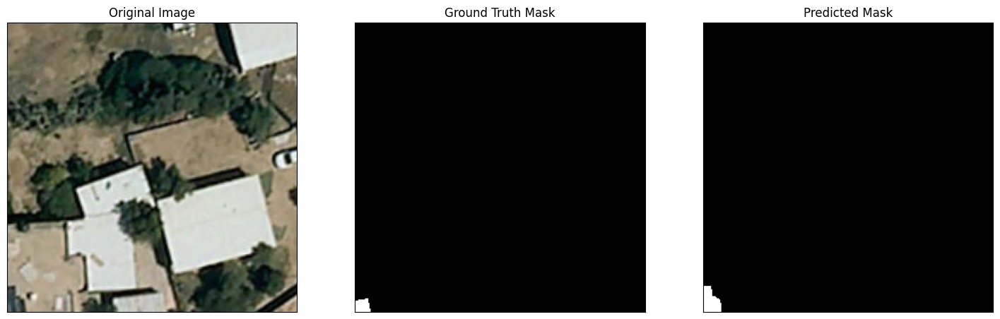

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 15 - 000000002580.tif:
IoU: 0.7260
F1: 0.8413
Accuracy: 0.9988
Precision: 0.7260
Recall: 1.0000
IoU_Sinkholes: 0.7260
IoU_Background: 0.9988
Dice: 0.8413
TPR: 1.0000
FPR: 0.0012


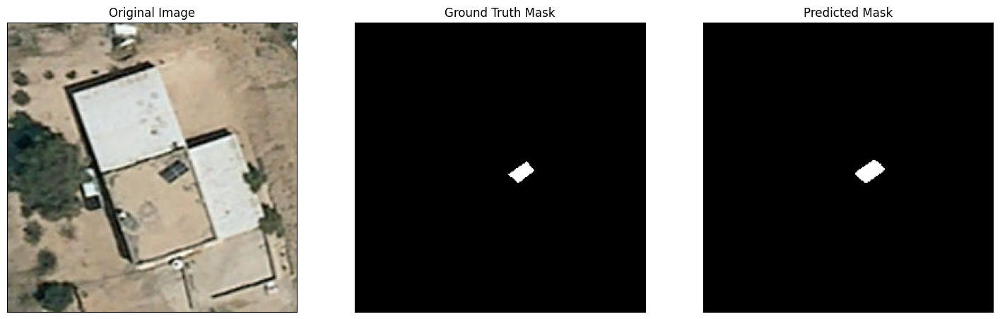

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Example 16 - 000000002584.tif:
IoU: 0.0000
F1: 0.0000
Accuracy: 0.9998
Precision: 0.0000
Recall: 0.0000
IoU_Sinkholes: 0.0000
IoU_Background: 0.9998
Dice: 0.0000
TPR: 0.0000
FPR: 0.0000


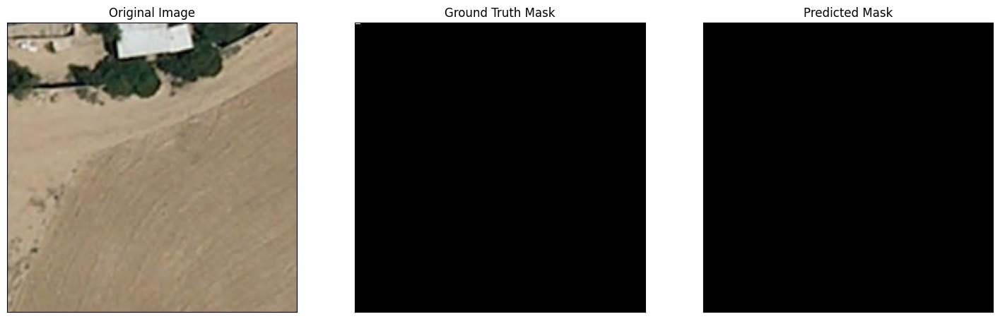

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 17 - 000000002590.tif:
IoU: 0.5412
F1: 0.7023
Accuracy: 0.9941
Precision: 0.5412
Recall: 1.0000
IoU_Sinkholes: 0.5412
IoU_Background: 0.9941
Dice: 0.7023
TPR: 1.0000
FPR: 0.0059


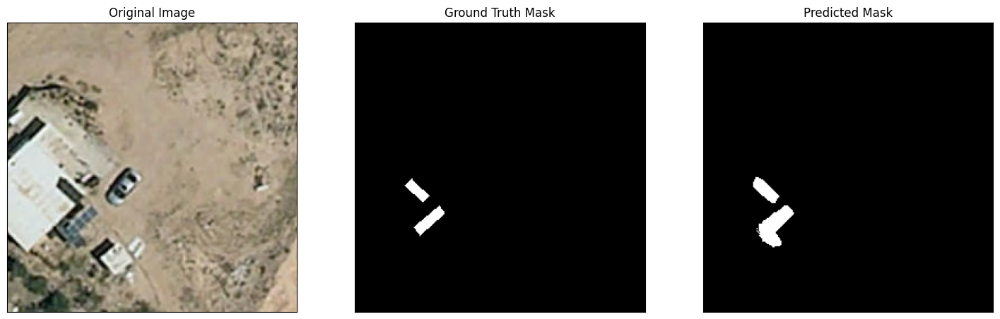

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 18 - 000000002595.tif:
IoU: 0.6964
F1: 0.8210
Accuracy: 0.9976
Precision: 0.6977
Recall: 0.9973
IoU_Sinkholes: 0.6964
IoU_Background: 0.9975
Dice: 0.8210
TPR: 0.9973
FPR: 0.0024


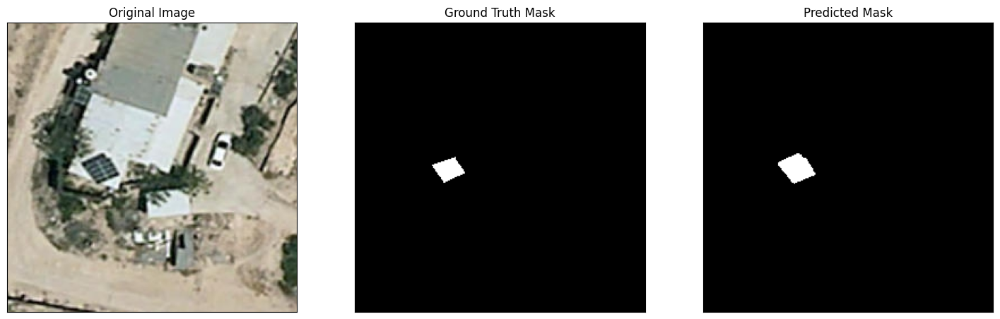

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 19 - 000000002596.tif:
IoU: 0.6630
F1: 0.7973
Accuracy: 0.9902
Precision: 0.6707
Recall: 0.9829
IoU_Sinkholes: 0.6630
IoU_Background: 0.9900
Dice: 0.7973
TPR: 0.9829
FPR: 0.0096


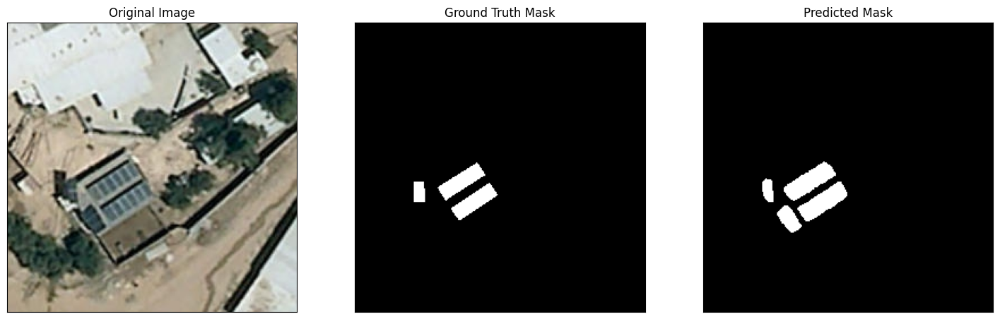

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 20 - 000000002602.tif:
IoU: 0.6938
F1: 0.8193
Accuracy: 0.9925
Precision: 0.7722
Recall: 0.8725
IoU_Sinkholes: 0.6938
IoU_Background: 0.9924
Dice: 0.8193
TPR: 0.8725
FPR: 0.0051


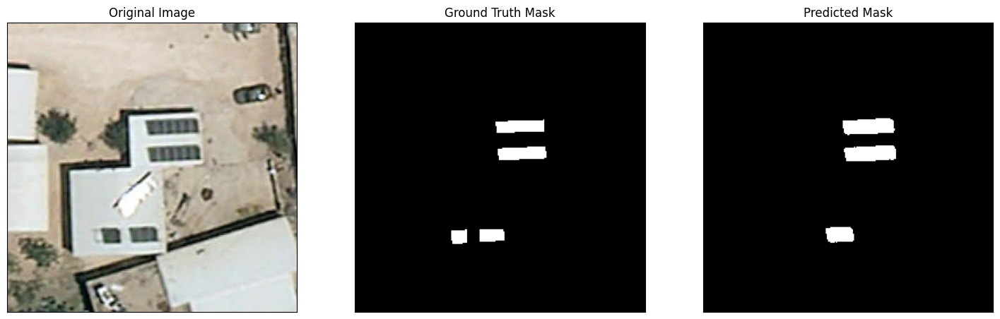

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Example 21 - 000000002607.tif:
IoU: 0.0000
F1: 0.0000
Accuracy: 0.9994
Precision: 0.0000
Recall: 0.0000
IoU_Sinkholes: 0.0000
IoU_Background: 0.9994
Dice: 0.0000
TPR: 0.0000
FPR: 0.0000


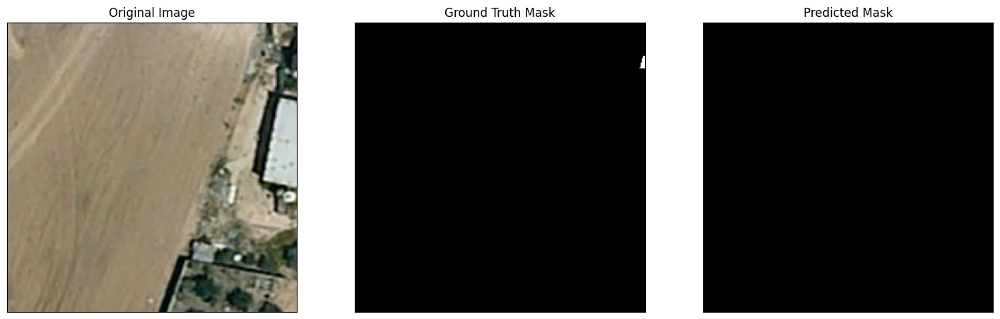

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 22 - 000000002616.tif:
IoU: 0.8510
F1: 0.9195
Accuracy: 0.9960
Precision: 0.8524
Recall: 0.9980
IoU_Sinkholes: 0.8510
IoU_Background: 0.9959
Dice: 0.9195
TPR: 0.9980
FPR: 0.0041


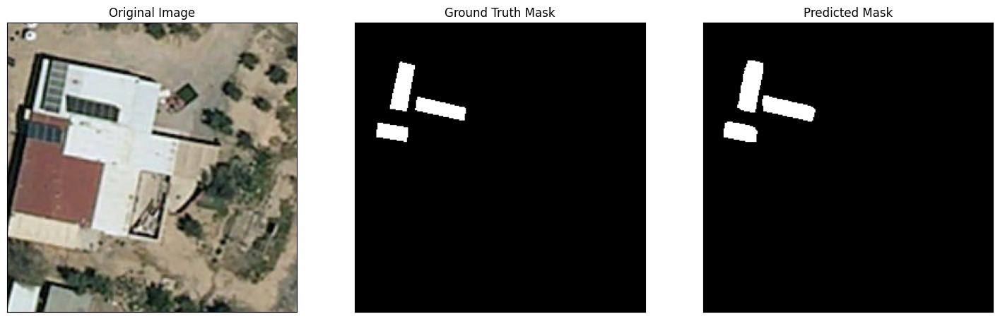

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 23 - 000000002622.tif:
IoU: 0.8912
F1: 0.9425
Accuracy: 0.9994
Precision: 0.8960
Recall: 0.9941
IoU_Sinkholes: 0.8912
IoU_Background: 0.9994
Dice: 0.9425
TPR: 0.9941
FPR: 0.0006


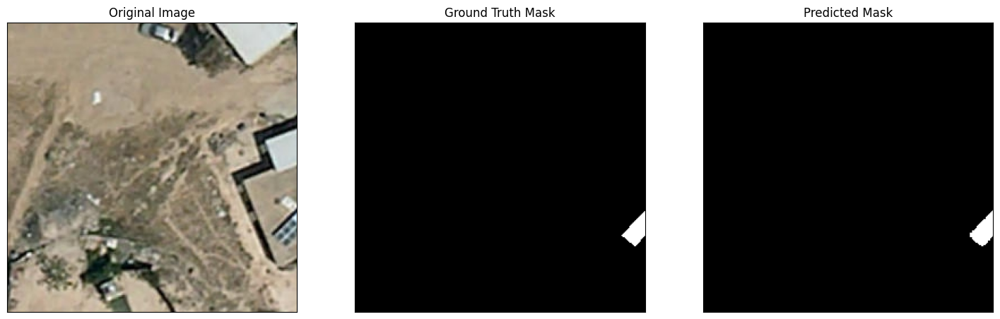

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Example 24 - 000000002624.tif:
IoU: 0.8380
F1: 0.9119
Accuracy: 0.9929
Precision: 0.8406
Recall: 0.9963
IoU_Sinkholes: 0.8380
IoU_Background: 0.9927
Dice: 0.9119
TPR: 0.9963
FPR: 0.0072


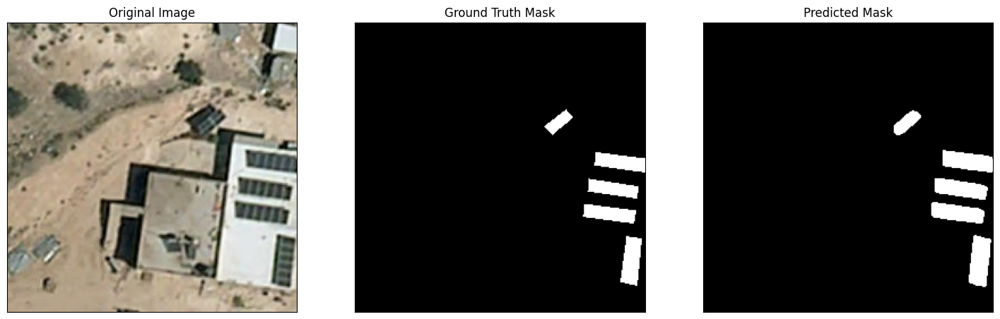

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Example 25 - 000000002625.tif:
IoU: 0.0000
F1: 0.0000
Accuracy: 0.9998
Precision: 0.0000
Recall: 0.0000
IoU_Sinkholes: 0.0000
IoU_Background: 0.9998
Dice: 0.0000
TPR: 0.0000
FPR: 0.0000


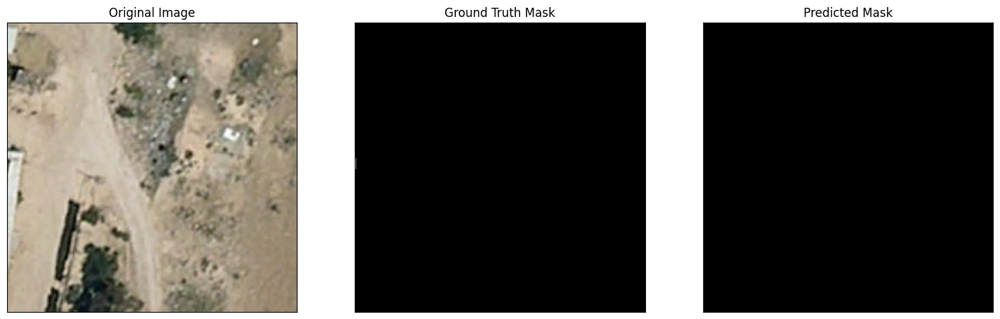

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\U

Mean Metrics:
IoU: 0.6811
F1: 0.7672
Accuracy: 0.9970
Precision: 0.7212
Recall: 0.8458
IoU_Sinkholes: 0.6811
IoU_Background: 0.9970
Dice: nan
TPR: 0.8458
FPR: 0.0021


In [22]:
import os
import numpy as np
import rasterio
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, jaccard_score, confusion_matrix
import matplotlib.pyplot as plt

def calculate_metrics(predicted_mask, ground_truth_mask):
    """
    Calculate evaluation metrics between predicted mask and ground truth mask.
    
    :param predicted_mask: Numpy array of the predicted mask
    :param ground_truth_mask: Numpy array of the ground truth mask
    :return: Dictionary with metrics (IoU, F1, Accuracy, Precision, Recall, IoU_Sinkholes, IoU_Background, Dice, TPR, FPR)
    """
    # Flatten the masks
    pred_flat = predicted_mask.flatten()
    gt_flat = ground_truth_mask.flatten()
    
    # Calculate metrics
    iou = jaccard_score(gt_flat, pred_flat, average='binary')
    f1 = f1_score(gt_flat, pred_flat, average='binary')
    accuracy = accuracy_score(gt_flat, pred_flat)
    precision = precision_score(gt_flat, pred_flat, average='binary')
    recall = recall_score(gt_flat, pred_flat, average='binary')
    
    # Calculate IoU for sinkholes (class 1) and background (class 0)
    iou_sinkholes = jaccard_score(gt_flat, pred_flat, pos_label=1)
    iou_background = jaccard_score(gt_flat, pred_flat, pos_label=0)
    
    # Calculate Dice coefficient
    intersection = np.sum((gt_flat == 1) & (pred_flat == 1))
    dice = 2 * intersection / (np.sum(gt_flat == 1) + np.sum(pred_flat == 1))
    
    # Calculate confusion matrix components
    cm = confusion_matrix(gt_flat, pred_flat).ravel()
    
    if len(cm) == 4:
        tn, fp, fn, tp = cm
        tpr = tp / (tp + fn)
        fpr = fp / (fp + tn)
    else:
        tn, fp, fn, tp = 0, 0, 0, 0
        tpr = 0
        fpr = 0
    
    return {
        "IoU": iou,
        "F1": f1,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "IoU_Sinkholes": iou_sinkholes,
        "IoU_Background": iou_background,
        "Dice": dice,
        "TPR": tpr,
        "FPR": fpr
    }

def evaluate_predictions(predicted_folder, ground_truth_folder, original_folder, num_examples=25):
    """
    Evaluate predictions by comparing predicted masks with ground truth masks and print a few examples.
    
    :param predicted_folder: Path to the folder containing predicted masks
    :param ground_truth_folder: Path to the folder containing ground truth masks
    :param original_folder: Path to the folder containing original images
    :param num_examples: Number of examples to print
    :return: Dictionary with mean metrics (IoU, F1, Accuracy, Precision, Recall, IoU_Sinkholes, IoU_Background, Dice, TPR, FPR)
    """
    metrics = {
        "IoU": [],
        "F1": [],
        "Accuracy": [],
        "Precision": [],
        "Recall": [],
        "IoU_Sinkholes": [],
        "IoU_Background": [],
        "Dice": [],
        "TPR": [],
        "FPR": []
    }
    
    example_count = 0
    skip_files = []
    
    for filename in os.listdir(predicted_folder):
        if filename in skip_files:  # Skip these files
            continue
        if filename.endswith(".tif") or filename.endswith(".tiff"):
            pred_mask_path = os.path.join(predicted_folder, filename)
            gt_mask_path = os.path.join(ground_truth_folder, filename.replace("_combined_mask", ""))
            original_image_path = os.path.join(original_folder, filename)
            
            if not os.path.exists(gt_mask_path):
                print(f"Ground truth mask not found for {filename}")
                continue
            
            if not os.path.exists(original_image_path):
                print(f"Original image not found for {filename}")
                continue
            
            with rasterio.open(pred_mask_path) as src:
                pred_mask = src.read(1)
            
            with rasterio.open(gt_mask_path) as src:
                gt_mask = src.read(1)
                
            with rasterio.open(original_image_path) as src:
                original_image = src.read([1, 2, 3])
                original_image = np.dstack(original_image)
            
            # Calculate metrics for the current pair of masks
            current_metrics = calculate_metrics(pred_mask, gt_mask)
            
            for key, value in current_metrics.items():
                metrics[key].append(value)
            
            # Print a few examples
            if example_count < num_examples:
                print(f"Example {example_count + 1} - {filename}:")
                for key, value in current_metrics.items():
                    print(f"{key}: {value:.4f}")
                
                fig, ax = plt.subplots(1, 3, figsize=(18, 6))
                
                # Plot original image
                ax[0].imshow(original_image)
                ax[0].set_title('Original Image')
                ax[0].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
                
                # Plot ground truth mask
                gt_image = np.zeros_like(gt_mask)
                gt_image[gt_mask == 1] = 255
                ax[1].imshow(gt_image, cmap='gray', extent=[0, gt_image.shape[1], gt_image.shape[0], 0])
                ax[1].set_title('Ground Truth Mask')
                ax[1].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
                
                # Plot predicted mask
                pred_image = np.zeros_like(pred_mask)
                pred_image[pred_mask == 1] = 255
                ax[2].imshow(pred_image, cmap='gray', extent=[0, pred_image.shape[1], pred_image.shape[0], 0])
                ax[2].set_title('Predicted Mask')
                ax[2].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
                
                plt.show()
                
                example_count += 1
    
    # Calculate mean metrics
    mean_metrics = {key: np.mean(value) for key, value in metrics.items()}
    
    return mean_metrics

# Define the folder paths
predicted_folder = "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/sam2.1_results_bbox_from_yolov9/"
ground_truth_folder = "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/labels8b/test/"
original_folder = "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/"

# Evaluate the predictions
mean_metrics = evaluate_predictions(predicted_folder, ground_truth_folder, original_folder)

print("Mean Metrics:")
for metric, value in mean_metrics.items():
    print(f"{metric}: {value:.4f}")


### Install SAM2 and dependencies

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Function to read bounding boxes from txt file
def read_bboxes(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 6:  # bbox format
            class_id = int(parts[0])
            x_min, y_min, x_max, y_max = map(float, parts[1:5])
            confidence = float(parts[5])
            bboxes.append([class_id, x_min, y_min, x_max, y_max, confidence])
    return bboxes

# Function to read points from txt file
def read_points(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    points = []
    for line in lines:
        parts = line.strip().split(',')
        if len(parts) == 2:  # point format
            x, y = float(parts[0]), float(parts[1])
            points.append((x, y))
    return points

# Function to add scale marks to the axes
def add_scale_marks(ax, pixel_size_cm):
    pixel_size_m = pixel_size_cm / 100.0
    spacing_m = 5  # Adjusted to 5 meter intervals

    x_spacing = spacing_m / pixel_size_m
    y_spacing = spacing_m / pixel_size_m

    x_ticks = np.arange(0, ax.get_xlim()[1], x_spacing)
    y_ticks = np.arange(0, ax.get_ylim()[0], y_spacing)

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    ax2 = ax.secondary_yaxis('left')
    ax2.set_yticks(y_ticks)
    ax2.set_yticklabels(np.round(y_ticks * pixel_size_m).astype(int), fontsize=12)
    ax2.tick_params(right=False, left=True, labelleft=True, labelright=False)

    ax3 = ax.secondary_xaxis('bottom')
    ax3.set_xticks(x_ticks)
    ax3.set_xticklabels(np.round(x_ticks * pixel_size_m).astype(int), fontsize=12)
    ax3.tick_params(bottom=True, top=False, labelbottom=True, labeltop=False)

# Function to plot bounding boxes and points on image
def plot_image_with_prompts(image, boxes, points, title, pixel_size_cm, ax):
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if boxes:
        for box in boxes:
            class_id, x_min, y_min, x_max, y_max, confidence = box
            rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)
    if points:
        for point in points:
            ax.plot(point[0], point[1], 'o', color='yellow', markeredgewidth=1, markeredgecolor='black')
    ax.set_title(title, loc='center', fontsize=25)
    ax.axis('on')
    add_scale_marks(ax, pixel_size_cm)

# Paths for each resolution
paths = {
    '2015': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/points_from_masks/'
    },
    '2017': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/points_from_masks/'
    },
    '2022': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/points_from_masks/'
    }
}

# List of image years and resolutions in the new order
years_resolutions = ['2022', '2017', '2015']

# Define the pixel size for each resolution (in centimeters)
pixel_sizes_cm = {
    '2015': 25,
    '2017': 15,
    '2022': 13
}

# Minimum number of objects to plot an image
min_objects = 4

fig, axs = plt.subplots(3, 4, figsize=(20, 15))  # Adjust figsize to accommodate more images

for i, year in enumerate(years_resolutions):
    image_files = [f for f in os.listdir(paths[year]['image']) if f.endswith('.tif')]
    count = 0  # Counter to ensure only 2 images are plotted per year
    if image_files:
        for image_file in image_files[1:]:  # Skip the first image
            if count >= 2:
                break
            image_path = os.path.join(paths[year]['image'], image_file)
            bbox_file = os.path.join(paths[year]['bbox'], image_file.replace('.tif', '.txt'))
            points_file = os.path.join(paths[year]['points'], image_file.replace('.tif', '.txt'))
            
            image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

            bboxes = read_bboxes(bbox_file)
            points = read_points(points_file)

            if len(bboxes) >= min_objects:  # Filter by minimum number of objects
                col = count * 2
                # Alternate points column position
                plot_image_with_prompts(image.copy(), bboxes, [], '', pixel_sizes_cm[year], axs[i, col])
                plot_image_with_prompts(image.copy(), [], points, '', pixel_sizes_cm[year], axs[i, col + 1])
                count += 1

for ax, row in zip(axs[:, 0], ['Resolution (m) 0.13', 'Resolution (m) 0.15', 'Resolution (m) 0.25']):
    ax.set_ylabel(row, rotation=90, fontsize=30, labelpad=30)  # Increased fontsize

plt.subplots_adjust(wspace=0.01, hspace=0.01)  # Decrease space between columns and rows

plt.tight_layout()
plt.savefig('output.png')  # Save the plot as a PNG file
plt.show()


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Function to read bounding boxes from txt file
def read_bboxes(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 6:  # bbox format
            class_id = int(parts[0])
            x_min, y_min, x_max, y_max = map(float, parts[1:5])
            confidence = float(parts[5])
            bboxes.append([class_id, x_min, y_min, x_max, y_max, confidence])
    return bboxes

# Function to read points from txt file
def read_points(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    points = []
    for line in lines:
        parts = line.strip().split(',')
        if len(parts) == 2:  # point format
            x, y = float(parts[0]), float(parts[1])
            points.append((x, y))
    return points

# Function to add scale marks to the axes
def add_scale_marks(ax, pixel_size_cm):
    pixel_size_m = pixel_size_cm / 100.0
    spacing_m = 5  # Adjusted to 5 meter intervals

    x_spacing = spacing_m / pixel_size_m
    y_spacing = spacing_m / pixel_size_m

    x_ticks = np.arange(0, ax.get_xlim()[1], x_spacing)
    y_ticks = np.arange(0, ax.get_ylim()[0], y_spacing)

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    ax2 = ax.secondary_yaxis('left')
    ax2.set_yticks(y_ticks)
    ax2.set_yticklabels(np.round(y_ticks * pixel_size_m).astype(int), fontsize=12)
    ax2.tick_params(right=False, left=True, labelleft=True, labelright=False)

    ax3 = ax.secondary_xaxis('bottom')
    ax3.set_xticks(x_ticks)
    ax3.set_xticklabels(np.round(x_ticks * pixel_size_m).astype(int), fontsize=12)
    ax3.tick_params(bottom=True, top=False, labelbottom=True, labeltop=False)

# Function to plot bounding boxes and points on image
def plot_image_with_prompts(image, boxes, points, title, pixel_size_cm, ax):
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if boxes:
        for box in boxes:
            class_id, x_min, y_min, x_max, y_max, confidence = box
            rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)
    if points:
        for point in points:
            ax.plot(point[0], point[1], 'o', color='yellow', markersize=8, markeredgewidth=1, markeredgecolor='black')  # Increased markersize to 10
    ax.set_title(title, loc='center', fontsize=25)
    ax.axis('on')
    add_scale_marks(ax, pixel_size_cm)

# Paths for each resolution
paths = {
    '2015': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/points_from_masks/'
    },
    '2017': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/points_from_masks/'
    },
    '2022': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/points_from_masks/'
    }
}

# Define the pixel size for each resolution (in centimeters)
pixel_sizes_cm = {
    '2015': 25,
    '2017': 15,
    '2022': 13
}

# Minimum number of objects to plot an image
min_objects = 4

# Create a figure with 3 subplots: image without prompts, bbox panel, and points panel
fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 3 panels: image without prompts, bbox, and points

year = '2022'
image_files = [f for f in os.listdir(paths[year]['image']) if f.endswith('.tif')]
image_counter = 0  # Counter to track how many images have been processed

if image_files:
    for image_file in image_files:  # Process each image
        image_path = os.path.join(paths[year]['image'], image_file)
        bbox_file = os.path.join(paths[year]['bbox'], image_file.replace('.tif', '.txt'))
        points_file = os.path.join(paths[year]['points'], image_file.replace('.tif', '.txt'))

        image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

        bboxes = read_bboxes(bbox_file)
        points = read_points(points_file)

        if len(bboxes) >= min_objects:  # Apply the "minimum number of objects" rule
            image_counter += 1  # Increment counter only if the image meets the criteria
            if image_counter == 38:  # Only plot the second image that meets the criteria
                # Add the image without any prompts in the first panel (left)
                axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                axs[0].set_title('', loc='center', fontsize=25)
                axs[0].axis('on')
                add_scale_marks(axs[0], pixel_sizes_cm[year])

                # Add bounding boxes in the second panel
                plot_image_with_prompts(image.copy(), bboxes, [], '', pixel_sizes_cm[year], axs[1])

                # Add points in the third panel
                plot_image_with_prompts(image.copy(), [], points, '', pixel_sizes_cm[year], axs[2])

                break  # Stop after plotting the second qualifying image

if image_counter < 2:
    print(f"Less than 2 images met the minimum object criteria of {min_objects}.")

plt.subplots_adjust(wspace=0.01)  # Decrease space between columns

plt.tight_layout()
plt.savefig('output_single_row_with_image_on_left.png')  # Save the plot as a PNG file
plt.show()


In [12]:
import os

# Function to read bounding boxes from txt file
def read_bboxes(txt_file):
    bboxes = []
    try:
        with open(txt_file, 'r') as file:
            lines = file.readlines()
        for line in lines:
            parts = line.strip().split()
            if len(parts) == 6 or len(parts) == 7:  # Allow both formats
                class_id = int(parts[0])
                x_min, y_min, x_max, y_max = map(float, parts[1:5])
                confidence = float(parts[5])
                bboxes.append([class_id, x_min, y_min, x_max, y_max, confidence])
            else:
                print(f"Unexpected format in file {txt_file}: {line}")
    except FileNotFoundError:
        print(f"File not found: {txt_file}")
    except Exception as e:
        print(f"Error reading {txt_file}: {e}")
    return bboxes

# Paths for each resolution
paths = {
    '2015': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/points_from_masks/'
    },
    '2017': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/points_from_masks/'
    },
    '2022': {
        'image': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/',
        'bbox': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/bbox_from_masks/',
        'points': 'D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/points_from_masks/'
    }
}

# List of image years and resolutions
years_resolutions = ['2015', '2017', '2022']

# Minimum number of objects to print the image name
min_objects = 4

# Dictionary to store the image names with more than 4 objects by year
image_names_by_year = {year: [] for year in years_resolutions}

for year in years_resolutions:
    image_files = [f for f in os.listdir(paths[year]['image']) if f.endswith('.tif')]
    if image_files:
        for image_file in image_files:
            bbox_file = os.path.join(paths[year]['bbox'], image_file.replace('.tif', '.txt'))
            bboxes = read_bboxes(bbox_file)
            if len(bboxes) >= min_objects:  # Filter by minimum number of objects
                image_names_by_year[year].append(image_file)

# Print the names of images with more than 4 objects, grouped by year
for year, image_names in image_names_by_year.items():
    if image_names:
        print(f"\nYear: {year}")
        for image_name in image_names:
            print(image_name)



Year: 2015
000000000039.tif
000000002505.tif
000000002539.tif
000000002571.tif
000000002589.tif
000000002596.tif
000000002614.tif
000000002629.tif
000000007538.tif
000000007629.tif
000000010028.tif
000000010029.tif
000000010033.tif
000000010038.tif
000000010074.tif
000000010091.tif
000000017628.tif
000000017639.tif
000000017680.tif
000000025107.tif
000000025142.tif
000000025191.tif
000000025206.tif
000000025213.tif
000000025230.tif
000000027505.tif
000000032540.tif
000000032543.tif
000000032617.tif
000000032642.tif
000000032691.tif
000000032738.tif
000000032748.tif
000000035044.tif
000000035052.tif
000000035055.tif
000000042553.tif
000000042614.tif
000000042667.tif
000000042683.tif

Year: 2017
000000000131.tif
000000007511.tif
000000007513.tif
000000007525.tif
000000007555.tif
000000007561.tif
000000007611.tif
000000007630.tif
000000007651.tif
000000007669.tif
000000015058.tif
000000015183.tif
000000025003.tif
000000032817.tif
000000032893.tif
000000042755.tif
000000045349.tif
0000000

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


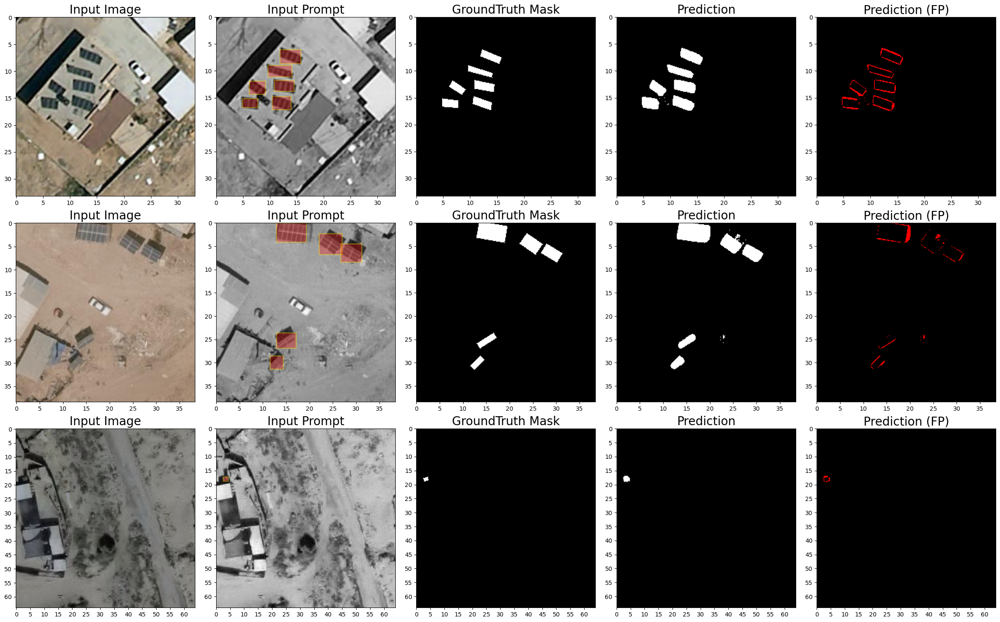

In [24]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import rasterio

# Function to read bounding boxes from txt file
def read_bboxes(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 6:  # bbox format
            class_id = int(parts[0])
            x_min, y_min, x_max, y_max = map(float, parts[1:5])
            confidence = float(parts[5])
            bboxes.append([class_id, x_min, y_min, x_max, y_max, confidence])
    return bboxes

# Function to read points from txt file
def read_points(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    points = []
    for line in lines:
        parts = line.strip().split(',')
        if len(parts) == 2:  # point format
            x, y = float(parts[0]), float(parts[1])
            points.append((x, y))
    return points

# Function to add scale marks to the axes
def add_scale_marks(ax, pixel_size_cm):
    pixel_size_m = pixel_size_cm / 100.0
    spacing_m = 5  # Adjusted to 5 meter intervals

    x_spacing = spacing_m / pixel_size_m
    y_spacing = spacing_m / pixel_size_m

    x_ticks = np.arange(0, ax.get_xlim()[1], x_spacing)
    y_ticks = np.arange(0, ax.get_ylim()[0], y_spacing)

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_xticklabels(np.round(x_ticks * pixel_size_m).astype(int))
    ax.set_yticklabels(np.round(y_ticks * pixel_size_m).astype(int))

    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

# Function to plot bounding boxes and points on image
def plot_image_with_prompts(image, boxes, points, title, pixel_size_cm, ax):
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if boxes:
        for box in boxes:
            class_id, x_min, y_min, x_max, y_max, confidence = box
            rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)
    if points:
        for point in points:
            ax.plot(point[0], point[1], 'o', color='yellow', markeredgewidth=2, markeredgecolor='black')
    ax.set_title(title, loc='center', fontsize=18)
    ax.axis('on')
    add_scale_marks(ax, pixel_size_cm)

def plot_combined_images(images_data, fig_combined, axes_combined, start_row, plot_bbox=True, plot_points=True):
    """
    Plot combined images into the provided axes.
    
    :param images_data: List of images and data to be plotted
    :param fig_combined: Figure for the combined plot
    :param axes_combined: Axes for the combined plot
    :param start_row: Starting row index to plot the images
    :param plot_bbox: Boolean to control whether to plot bounding boxes
    :param plot_points: Boolean to control whether to plot points
    """
    for i, data in enumerate(images_data):
        row = start_row + i
        for j, title in enumerate(data['titles']):
            ax = axes_combined[row, j]
            if title == 'Input Image':
                ax.imshow(data['original_image'])
            elif title == 'Input Prompt':
                ax.imshow(data['gray_rgb'], cmap='gray', extent=[0, data['original_image'].shape[1], data['original_image'].shape[0], 0])
                if plot_bbox:
                    for box in data['boxes']:
                        class_id, x_min, y_min, x_max, y_max, confidence = box
                        rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='yellow', facecolor='red', alpha=0.3)
                        ax.add_patch(rect)
                if plot_points:
                    for point in data['points']:
                        ax.plot(point[0], point[1], 'o', color='yellow')  # Plot points in orange
            elif title == 'GroundTruth Mask':
                gt_image = np.zeros_like(data['gt_mask'])
                gt_image[data['gt_mask'] == 1] = 255
                ax.imshow(gt_image, cmap='gray', extent=[0, gt_image.shape[1], gt_image.shape[0], 0])
                ax.set_facecolor('black')
            elif title == 'Prediction':
                pred_image = np.zeros_like(data['pred_mask'])
                pred_image[data['pred_mask'] == 1] = 255
                ax.imshow(pred_image, cmap='gray', extent=[0, pred_image.shape[1], pred_image.shape[0], 0])
                ax.set_facecolor('black')
            elif title == 'Prediction (FP)':
                false_positives = np.zeros_like(data['pred_mask'])
                false_positives[(data['pred_mask'] == 1) & (data['gt_mask'] == 0)] = 1
                false_positive_image = np.zeros_like(data['pred_mask'])
                false_positive_image = np.dstack((false_positives * 255, false_positive_image, false_positive_image))
                ax.imshow(false_positive_image, extent=[0, false_positive_image.shape[1], false_positive_image.shape[0], 0])
            ax.set_title(title, fontsize=20)
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
            add_scale_marks(ax, data['pixel_size_cm'])

def plot_examples_for_year(predicted_folder, ground_truth_folder, bbox_folder, original_folder, points_folder, pixel_size_cm, plot_bbox=True, plot_points=True, num_examples=3, filenames=None):
    """
    Plot examples by comparing predicted masks with ground truth masks and other data for a specific year.
    
    :param predicted_folder: Path to the folder containing predicted masks
    :param ground_truth_folder: Path to the folder containing ground truth masks
    :param bbox_folder: Path to the folder containing bounding boxes
    :param original_folder: Path to the folder containing original images
    :param points_folder: Path to the folder containing points
    :param pixel_size_cm: Pixel size in centimeters for scaling
    :param plot_bbox: Boolean to control whether to plot bounding boxes
    :param plot_points: Boolean to control whether to plot points
    :param num_examples: Number of examples to plot
    :param filenames: List of filenames to filter
    :return: List of images and data to be plotted
    """
    example_count = 0
    images_data = []
    titles = ['Input Image', 'Input Prompt', 'GroundTruth Mask', 'Prediction', 'Prediction (FP)']

    for filename in os.listdir(predicted_folder):
        if filenames and filename not in filenames:
            continue

        if filename.endswith(".tif") or filename.endswith(".tiff"):
            pred_mask_path = os.path.join(predicted_folder, filename)
            gt_mask_path = os.path.join(ground_truth_folder, filename.replace("_combined_mask", ""))
            bbox_path = os.path.join(bbox_folder, filename.replace(".tif", ".txt").replace(".tiff", ".txt"))
            original_image_path = os.path.join(original_folder, filename)
            points_path = os.path.join(points_folder, filename.replace(".tif", ".txt").replace(".tiff", ".txt"))
            
            if not all(os.path.exists(path) for path in [gt_mask_path, bbox_path, original_image_path, points_path]):
                continue
            
            with rasterio.open(pred_mask_path) as src:
                pred_mask = src.read(1)
            
            with rasterio.open(gt_mask_path) as src:
                gt_mask = src.read(1)
                
            with rasterio.open(original_image_path) as src:
                original_image = src.read([1, 2, 3])
                original_image = np.dstack(original_image)
            
            points = read_points(points_path)
            
            # Read bounding boxes
            boxes = read_bboxes(bbox_path)
            
            if example_count < num_examples:
                images_data.append({
                    'original_image': original_image,
                    'gray_rgb': np.mean(original_image, axis=2),
                    'boxes': boxes,
                    'points': points,
                    'gt_mask': gt_mask,
                    'pred_mask': pred_mask,
                    'titles': titles,
                    'pixel_size_cm': pixel_size_cm,
                    'filename': filename  # Add the filename here
                })
                example_count += 1
                if example_count >= num_examples:
                    break
    return images_data

def plot_examples_by_years(predicted_folders, ground_truth_folders, bbox_folders, original_folders, points_folders, pixel_sizes_cm, plot_bbox=True, plot_points=True, num_examples=3, filenames=None):
    """
    Plot examples by comparing predicted masks with ground truth masks and other data from different years.
    
    :param predicted_folders: Dict with paths to the folders containing predicted masks for each year
    :param ground_truth_folders: Dict with paths to the folders containing ground truth masks for each year
    :param bbox_folders: Dict with paths to the folders containing bounding boxes for each year
    :param original_folders: Dict with paths to the folders containing original images for each year
    :param points_folders: Dict with paths to the folders containing points for each year
    :param pixel_sizes_cm: Dict with pixel sizes in centimeters for each year
    :param plot_bbox: Boolean to control whether to plot bounding boxes
    :param plot_points: Boolean to control whether to plot points
    :param num_examples: Number of examples to plot per year
    :param filenames: List of filenames to filter
    """
    fig_combined, axes_combined = plt.subplots(len(predicted_folders) * num_examples, 5, figsize=(30, 6 * len(predicted_folders) * num_examples))  # Multiple rows per year

    row = 0
    for year, predicted_folder in predicted_folders.items():
        gt_folder = ground_truth_folders[year]
        bbox_folder = bbox_folders[year]
        original_folder = original_folders[year]
        points_folder = points_folders[year]

        images_data = plot_examples_for_year(predicted_folder, gt_folder, bbox_folder, original_folder, points_folder, pixel_sizes_cm[year], plot_bbox, plot_points, num_examples, filenames)
        plot_combined_images(images_data, fig_combined, axes_combined, row, plot_bbox, plot_points)
        row += num_examples

    plt.subplots_adjust(wspace=0.05, hspace=0.15)
    plt.savefig('combined_examples_by_years_sam2_box1.png', bbox_inches='tight', dpi=300)
    plt.show()

# Define the folder paths for each year
predicted_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/sam2_results_from_points/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/sam2_results_from_bboxmasks/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/sam2_results_bbox_from_masks/"
}

ground_truth_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/labels8b/test/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/labels8b/test/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/labels8b/test/"
}

bbox_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/bbox_from_masks/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/bbox_from_masks/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/bbox_from_masks/"
}

original_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/images/test/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/images/test/"
}

points_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/points_from_masks/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/points_from_masks/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/points_from_masks/"
}

# Define the pixel size for each resolution (in centimeters)
pixel_sizes_cm = {
    '2015': 25,
    '2017': 15,
    '2022': 13
}

# List of filenames to filter
filenames_to_plot = [
    '000000017508.tif',
    '000000057789.tif',
    '000000000004.tif',
    # Add more filenames as needed
]

# Plot the examples with bounding boxes and points from different years, filtered by filenames
plot_examples_by_years(predicted_folders, ground_truth_folders, bbox_folders, original_folders, points_folders, pixel_sizes_cm, plot_bbox=True, plot_points=False, num_examples=1, filenames=filenames_to_plot)


### Plots

C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)
C:\Users\osherr\YOLOV10\lib\site-packages\rasterio\__init__.py:332: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


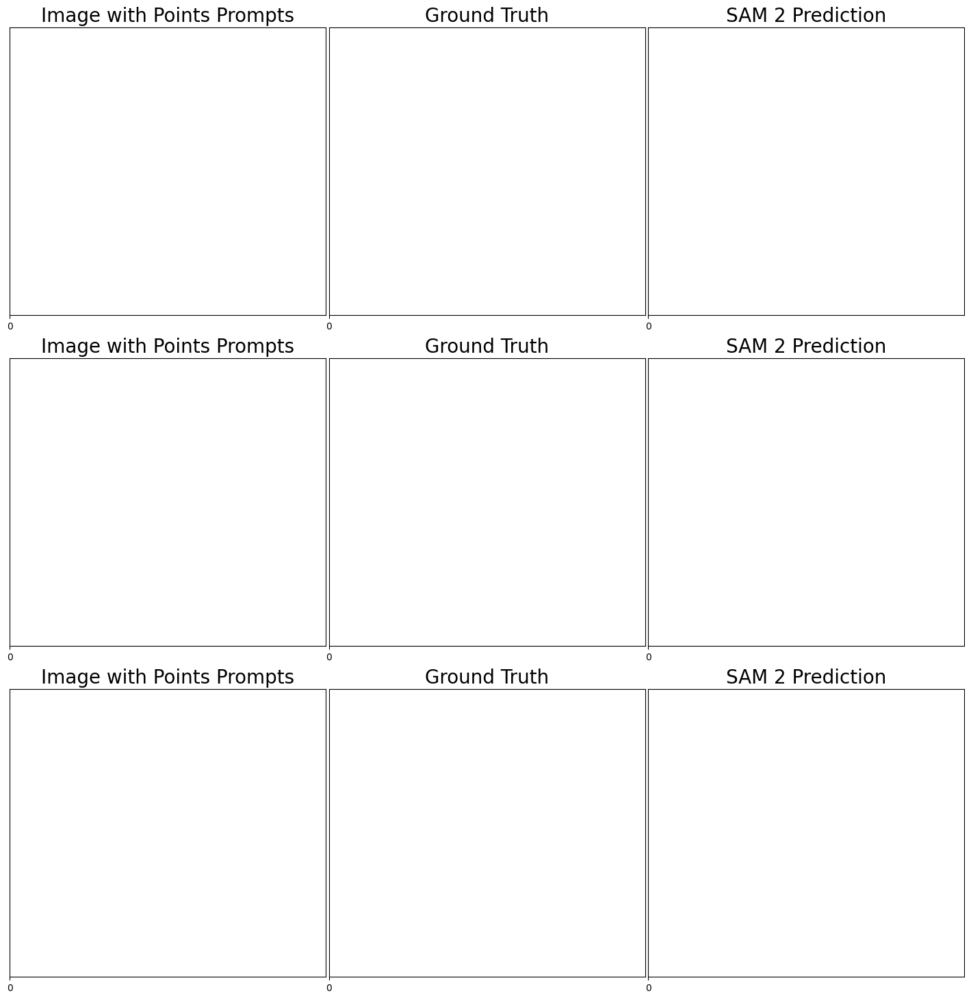

In [41]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import rasterio

# Function to read bounding boxes from txt file
def read_bboxes(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    bboxes = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 6:  # bbox format
            class_id = int(parts[0])
            x_min, y_min, x_max, y_max = map(float, parts[1:5])
            confidence = float(parts[5])
            bboxes.append([class_id, x_min, y_min, x_max, y_max, confidence])
    return bboxes

# Function to read points from txt file
def read_points(txt_file):
    with open(txt_file, 'r') as file:
        lines = file.readlines()
    points = []
    for line in lines:
        parts = line.strip().split(',')
        if len(parts) == 2:  # point format
            x, y = float(parts[0]), float(parts[1])
            points.append((x, y))
    return points

# Function to add scale marks to the axes
def add_scale_marks(ax, pixel_size_cm):
    pixel_size_m = pixel_size_cm / 100.0
    spacing_m = 5  # Adjusted to 5 meter intervals

    x_spacing = spacing_m / pixel_size_m
    y_spacing = spacing_m / pixel_size_m

    x_ticks = np.arange(0, ax.get_xlim()[1], x_spacing)
    y_ticks = np.arange(0, ax.get_ylim()[0], y_spacing)

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_xticklabels(np.round(x_ticks * pixel_size_m).astype(int))
    ax.set_yticklabels(np.round(y_ticks * pixel_size_m).astype(int))

    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

# Function to plot bounding boxes and points on image
def plot_image_with_prompts(image, boxes, points, title, pixel_size_cm, ax):
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if boxes:
        for box in boxes:
            class_id, x_min, y_min, x_max, y_max, confidence = box
            rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)
    if points:
        for point in points:
            ax.plot(point[0], point[1], 'o', color='yellow', markeredgewidth=2, markeredgecolor='black')
    ax.set_title(title, loc='center', fontsize=18)
    ax.axis('on')
    add_scale_marks(ax, pixel_size_cm)

def plot_combined_images(images_data, fig_combined, axes_combined, start_row, plot_bbox=True, plot_points=True):
    """
    Plot combined images into the provided axes.
    
    :param images_data: List of images and data to be plotted
    :param fig_combined: Figure for the combined plot
    :param axes_combined: Axes for the combined plot
    :param start_row: Starting row index to plot the images
    :param plot_bbox: Boolean to control whether to plot bounding boxes
    :param plot_points: Boolean to control whether to plot points
    """
    for i, data in enumerate(images_data):
        row = start_row + i
        for j, title in enumerate(data['titles']):
            ax = axes_combined[row, j]
            if title == 'Input Image':
                ax.imshow(data['original_image'])
                if plot_bbox:
                    for box in data['boxes']:
                        class_id, x_min, y_min, x_max, y_max, confidence = box
                        rect = Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='yellow', facecolor='none')
                        ax.add_patch(rect)
                if plot_points:
                    for point in data['points']:
                        ax.plot(point[0], point[1], 'o', color='yellow', markeredgewidth=2, markeredgecolor='black')
            elif title == 'GroundTruth Mask':
                gt_image = np.zeros_like(data['gt_mask'])
                gt_image[data['gt_mask'] == 1] = 255
                ax.imshow(gt_image, cmap='gray', extent=[0, gt_image.shape[1], gt_image.shape[0], 0])
                ax.set_facecolor('black')
            elif title == 'Prediction':
                pred_image = np.zeros_like(data['pred_mask'])
                pred_image[data['pred_mask'] == 1] = 255
                ax.imshow(pred_image, cmap='gray', extent=[0, pred_image.shape[1], pred_image.shape[0], 0])
                ax.set_facecolor('black')
            ax.set_title(title, fontsize=20)
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
            add_scale_marks(ax, data['pixel_size_cm'])

def plot_examples_for_year(predicted_folder, ground_truth_folder, bbox_folder, original_folder, points_folder, pixel_size_cm, plot_bbox=True, plot_points=True, num_examples=3, filenames=None):
    """
    Plot examples by comparing predicted masks with ground truth masks and other data for a specific year.
    
    :param predicted_folder: Path to the folder containing predicted masks
    :param ground_truth_folder: Path to the folder containing ground truth masks
    :param bbox_folder: Path to the folder containing bounding boxes
    :param original_folder: Path to the folder containing original images
    :param points_folder: Path to the folder containing points
    :param pixel_size_cm: Pixel size in centimeters for scaling
    :param plot_bbox: Boolean to control whether to plot bounding boxes
    :param plot_points: Boolean to control whether to plot points
    :param num_examples: Number of examples to plot
    :param filenames: List of filenames to filter
    :return: List of images and data to be plotted
    """
    example_count = 0
    images_data = []
    titles = ['Image with Points Prompts', 'Ground Truth', 'SAM 2 Prediction']

    for filename in os.listdir(predicted_folder):
        if filenames and filename not in filenames:
            continue

        if filename.endswith(".tif") or filename.endswith(".tiff"):
            pred_mask_path = os.path.join(predicted_folder, filename)
            gt_mask_path = os.path.join(ground_truth_folder, filename.replace("_combined_mask", ""))
            bbox_path = os.path.join(bbox_folder, filename.replace(".tif", ".txt").replace(".tiff", ".txt"))
            original_image_path = os.path.join(original_folder, filename)
            points_path = os.path.join(points_folder, filename.replace(".tif", ".txt").replace(".tiff", ".txt"))
            
            if not all(os.path.exists(path) for path in [gt_mask_path, bbox_path, original_image_path, points_path]):
                continue
            
            with rasterio.open(pred_mask_path) as src:
                pred_mask = src.read(1)
            
            with rasterio.open(gt_mask_path) as src:
                gt_mask = src.read(1)
                
            with rasterio.open(original_image_path) as src:
                original_image = src.read([1, 2, 3])
                original_image = np.dstack(original_image)
            
            points = read_points(points_path)
            
            # Read bounding boxes
            boxes = read_bboxes(bbox_path)
            
            if example_count < num_examples:
                images_data.append({
                    'original_image': original_image,
                    'boxes': boxes,
                    'points': points,
                    'gt_mask': gt_mask,
                    'pred_mask': pred_mask,
                    'titles': titles,
                    'pixel_size_cm': pixel_size_cm,
                    'filename': filename  # Add the filename here
                })
                example_count += 1
                if example_count >= num_examples:
                    break
    return images_data
def plot_examples_by_years(predicted_folders, ground_truth_folders, bbox_folders, original_folders, points_folders, pixel_sizes_cm, plot_bbox=True, plot_points=True, num_examples=3, filenames=None):
    """
    Plot examples by comparing predicted masks with ground truth masks and other data from different years.
    
    :param predicted_folders: Dict with paths to the folders containing predicted masks for each year
    :param ground_truth_folders: Dict with paths to the folders containing ground truth masks for each year
    :param bbox_folders: Dict with paths to the folders containing bounding boxes for each year
    :param original_folders: Dict with paths to the folders containing original images for each year
    :param points_folders: Dict with paths to the folders containing points for each year
    :param pixel_sizes_cm: Dict with pixel sizes in centimeters for each year
    :param plot_bbox: Boolean to control whether to plot bounding boxes
    :param plot_points: Boolean to control whether to plot points
    :param num_examples: Number of examples to plot per year
    :param filenames: List of filenames to filter
    """
    fig_combined, axes_combined = plt.subplots(len(predicted_folders) * num_examples, 3, figsize=(18, 6 * len(predicted_folders) * num_examples))  # Adjusted for 3 columns: Input Image, GroundTruth Mask, Prediction

    row = 0
    for year, predicted_folder in predicted_folders.items():
        gt_folder = ground_truth_folders[year]
        bbox_folder = bbox_folders[year]
        original_folder = original_folders[year]
        points_folder = points_folders[year]

        images_data = plot_examples_for_year(predicted_folder, gt_folder, bbox_folder, original_folder, points_folder, pixel_sizes_cm[year], plot_bbox, plot_points, num_examples, filenames)
        plot_combined_images(images_data, fig_combined, axes_combined, row, plot_bbox, plot_points)
        row += num_examples

    plt.subplots_adjust(wspace=0.01, hspace=0.15)
    plt.savefig('combined_examples_by_years_sam2_points.png', bbox_inches='tight', dpi=300)
    plt.show()

# Define the folder paths for each year
predicted_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/sam2_results_bbox_from_masks/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/sam2_results_from_points/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/sam2_results_bbox_from_masks/"
}

ground_truth_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/labels8b/test/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/labels8b/test/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/labels8b/test/"
}

bbox_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/bbox_from_masks/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/bbox_from_masks/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/bbox_from_masks/"
}

original_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/images/test/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/images/test/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/images/test/"
}

points_folders = {
    '2022': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2022/points_from_masks/",
    '2017': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2017/points_from_masks/",
    '2015': "D:/Osher/ann_osher/YOLO_DATABASE_PANNELS/beer_sheva_2015/points_from_masks/"
}

# Define the pixel size for each resolution (in centimeters)
pixel_sizes_cm = {
    '2015': 25,
    '2017': 15,
    '2022': 15
}

# List of filenames to filter
filenames_to_plot = [
    '000000017508.tif',
    '000000007561.tif',
    '000000000004.tif',
    # Add more filenames as needed
]

# Plot the examples with bounding boxes and points from different years, filtered by filenames
plot_examples_by_years(predicted_folders, ground_truth_folders, bbox_folders, original_folders, points_folders, pixel_sizes_cm, plot_bbox=True, plot_points=False, num_examples=1, filenames=filenames_to_plot)



## Load model





## Automated mask generation

Since SAM 2 can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.

The class `SAM2AutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [ ]:
mask_generator = SAM2AutomaticMaskGenerator(sam2_model)

**NOTE:** OpenCV loads images in BGR format by default, so we convert to RGB for compatibility with the mask generator.

In [ ]:
IMAGE_PATH = f"{HOME}/data/dog.jpeg"

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam2_result = mask_generator.generate(image_rgb)

### Output format

`SAM2AutomaticMaskGenerator` returns a `list` of masks, where each mask is a `dict` containing various information about the mask:

* `segmentation` - `[np.ndarray]` - the mask with `(W, H)` shape, and `bool` type
* `area` - `[int]` - the area of the mask in pixels
* `bbox` - `[List[int]]` - the boundary box of the mask in `xywh` format
* `predicted_iou` - `[float]` - the model's own prediction for the quality of the mask
* `point_coords` - `[List[List[float]]]` - the sampled input point that generated this mask
* `stability_score` - `[float]` - an additional measure of mask quality
* `crop_box` - `List[int]` - the crop of the image used to generate this mask in `xywh` format

### Results visualisation

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.